# Group Number 12

Abithaa A. P. - 17302


---


Parvathi Biju - 17341


---


Parvathi Sanjana - 17344


---



Sahithya Senthil - 17355




> Crime Rate Analysis



In [ ]:
import numpy as np
import pandas as pd
from sklearn import preprocessing
from sklearn.neighbors import KNeighborsClassifier
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib as mpl
%matplotlib inline

# Reading the data


In [ ]:
crime = pd.read_csv('https://raw.githubusercontent.com/sahithyasenthil/mldmlab/master/crime.csv', encoding='latin-1')

In [ ]:
crime.head()

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location
0,I182070945,619,Larceny,LARCENY ALL OTHERS,D14,808,NaN,2018-09-02 13:00:00,2018,9,Sunday,13,Part One,LINCOLN ST,42.357791,-71.139371,"(42.35779134, -71.13937053)"
1,I182070943,1402,Vandalism,VANDALISM,C11,347,NaN,2018-08-21 00:00:00,2018,8,Tuesday,0,Part Two,HECLA ST,42.306821,-71.060300,"(42.30682138, -71.06030035)"
2,I182070941,3410,Towed,TOWED MOTOR VEHICLE,D4,151,NaN,2018-09-03 19:27:00,2018,9,Monday,19,Part Three,CAZENOVE ST,42.346589,-71.072429,"(42.34658879, -71.07242943)"
3,I182070940,3114,Investigate Property,INVESTIGATE PROPERTY,D4,272,NaN,2018-09-03 21:16:00,2018,9,Monday,21,Part Three,NEWCOMB ST,42.334182,-71.078664,"(42.33418175, -71.07866441)"
4,I182070938,3114,Investigate Property,INVESTIGATE PROPERTY,B3,421,NaN,2018-09-03 21:05:00,2018,9,Monday,21,Part Three,DELHI ST,42.275365,-71.090361,"(42.27536542, -71.09036101)"


In [ ]:
crime.shape

(319073, 17)

# PREPROCESSING


### shooting column

Binary encoding the SHOOTING column

In [ ]:
crime.SHOOTING=[1 if each=='Y' else 0 for each in crime.SHOOTING]
crime1=crime.copy()


### null values

In [ ]:
crime.isnull().sum()

INCIDENT_NUMBER            0
OFFENSE_CODE               0
OFFENSE_CODE_GROUP         0
OFFENSE_DESCRIPTION        0
DISTRICT                1765
REPORTING_AREA             0
SHOOTING                   0
OCCURRED_ON_DATE           0
YEAR                       0
MONTH                      0
DAY_OF_WEEK                0
HOUR                       0
UCR_PART                  90
STREET                 10871
Lat                    19999
Long                   19999
Location                   0
dtype: int64

The above analysis shows that:
1. District ha only 0.55% null values
2.  street, lat and long have around 4-5% null values

Hence dropping those rows, because they wouldn't make a difference.





In [ ]:
crime.dropna(how='any',inplace=True)


### lat and long with error values

A lot of columns had (-1,-1) in the location column which is not a valid latitute, longitude point for the city of BOSTON, hence dropping those rows

In [ ]:
indexNames = crime[ crime['Lat'] < 40 ].index

In [ ]:
crime.drop(index=indexNames,inplace=True)

# Visualization

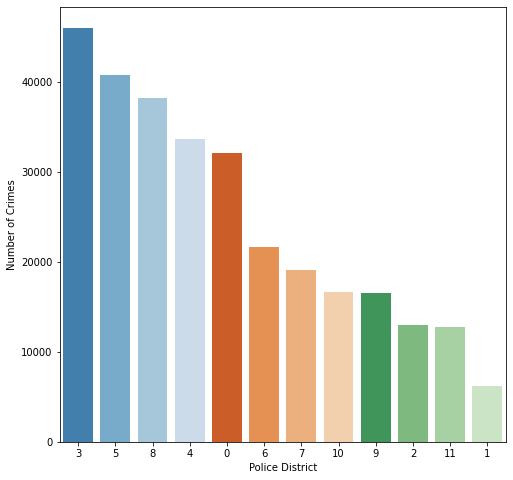

In [ ]:
plt.figure(figsize=(8,8))
sns.countplot(x="DISTRICT", data=crime,order=crime['DISTRICT'].value_counts().index,palette="tab20c")
plt.ylabel('Number of Crimes')
plt.xlabel('Police District')
plt.show()

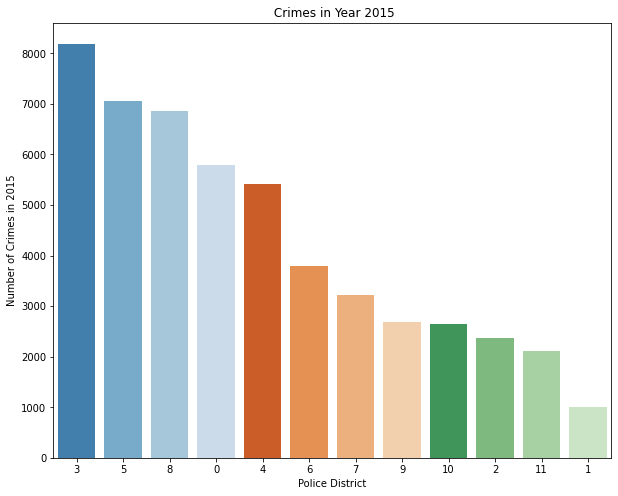

In [ ]:
plt.figure(figsize=(10,8))
sns.countplot(x=crime['DISTRICT'].loc[crime['YEAR']==2015],order=crime['DISTRICT'].loc[crime['YEAR']==2015].value_counts().index,palette="tab20c")
plt.title(' Crimes in Year 2015')
plt.ylabel('Number of Crimes in 2015')
plt.xlabel('Police District')
plt.show()

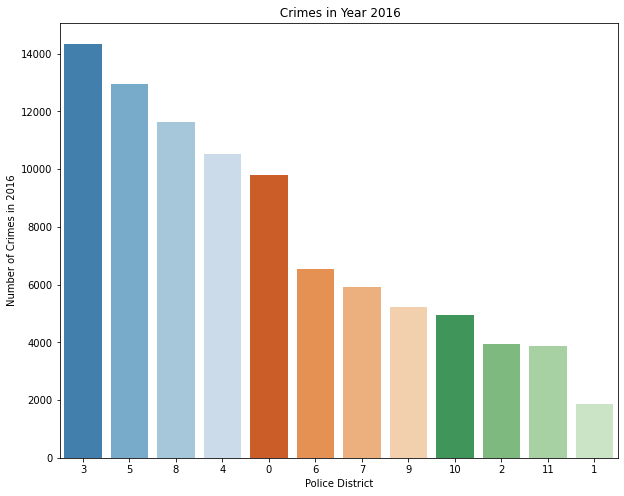

In [ ]:
plt.figure(figsize=(10,8))
sns.countplot(x=crime['DISTRICT'].loc[crime['YEAR']==2016],order=crime['DISTRICT'].loc[crime['YEAR']==2016].value_counts().index,palette="tab20c")
plt.title(' Crimes in Year 2016')
plt.ylabel('Number of Crimes in 2016')
plt.xlabel('Police District')
plt.show()

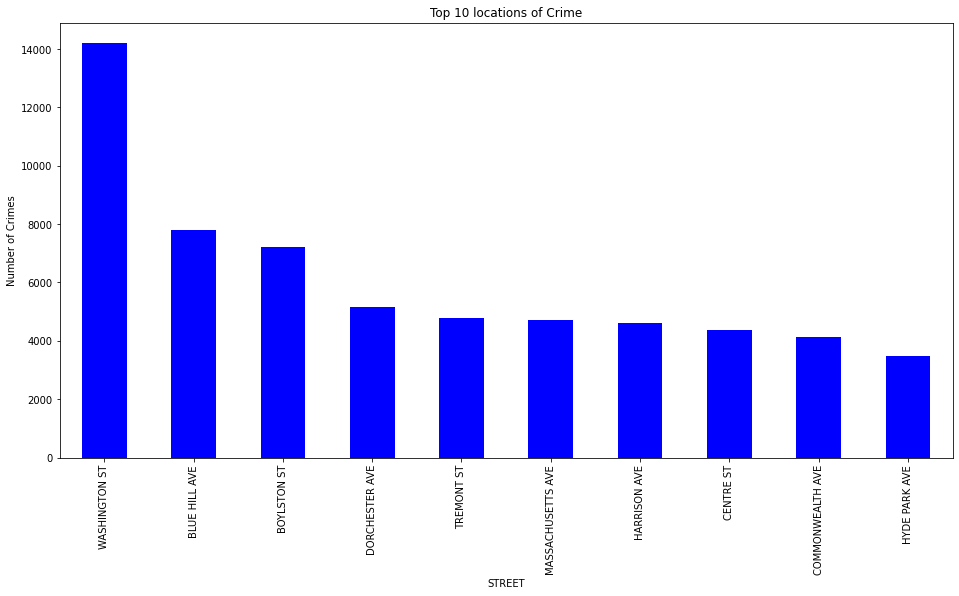

In [ ]:
plt.figure(figsize=(16,8))
x = crime1.groupby('STREET')['INCIDENT_NUMBER'].count().sort_values(ascending=False)
x = x [:10]
x.plot(kind='bar', color='blue')
plt.ylabel('Number of Crimes')
plt.title('Top 10 locations of Crime')
plt.show()

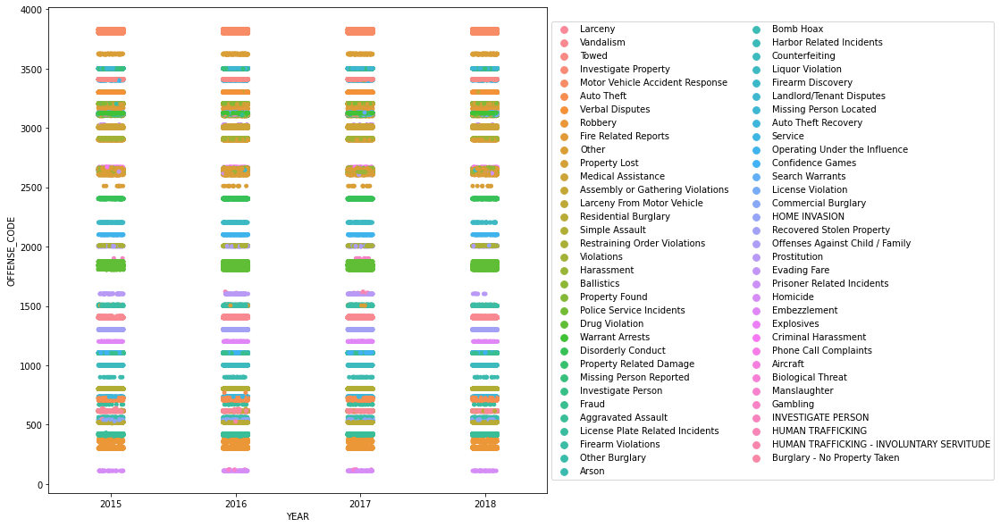

In [ ]:
plt.figure(figsize=(10,10))
sns.stripplot(y='OFFENSE_CODE',x='YEAR',data=crime1,hue="OFFENSE_CODE_GROUP")
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5),ncol=2)
plt.show()

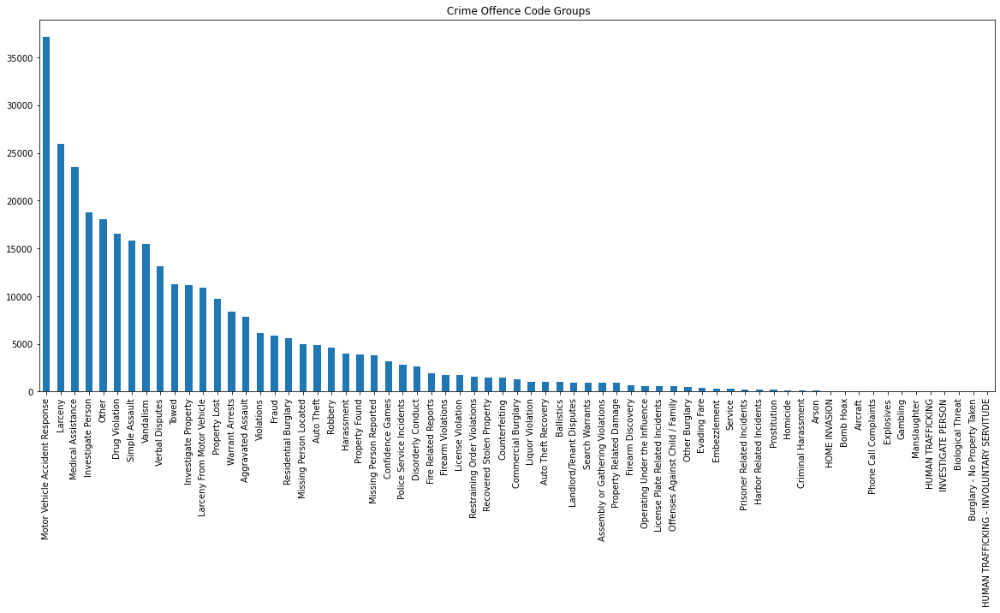

In [ ]:
plt.figure(figsize=(20,8))
crime1['OFFENSE_CODE_GROUP'].value_counts().plot.bar()
plt.title(' Crime Offence Code Groups')
plt.show()

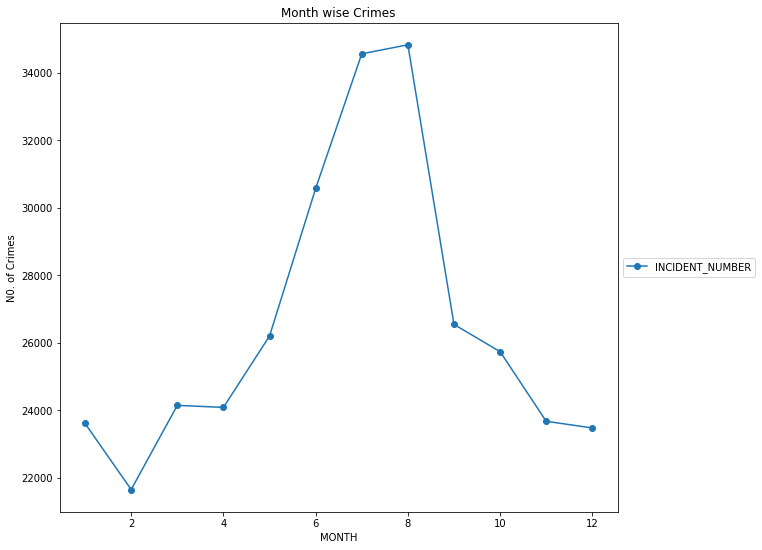

In [ ]:
plt.figure(figsize=(10,9))
crime1.groupby(['MONTH'])['INCIDENT_NUMBER'].count().plot(marker = 'o')
plt.ylabel('N0. of Crimes')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5),ncol=2)
plt.title('Month wise Crimes')
plt.show()

<Figure size 1152x576 with 0 Axes>

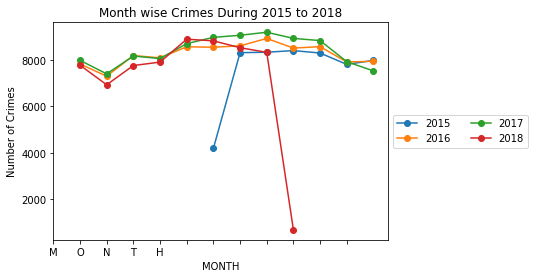

In [ ]:
plt.figure(figsize=(16,8))
crime1.groupby(['MONTH', 'YEAR'])['INCIDENT_NUMBER'].count().unstack().plot(marker = 'o')
plt.xticks(np.arange(12), 'MONTH')
plt.ylabel('Number of Crimes')
plt.title('Month wise Crimes During 2015 to 2018')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5),ncol=2)
plt.show()


<Figure size 1152x864 with 0 Axes>

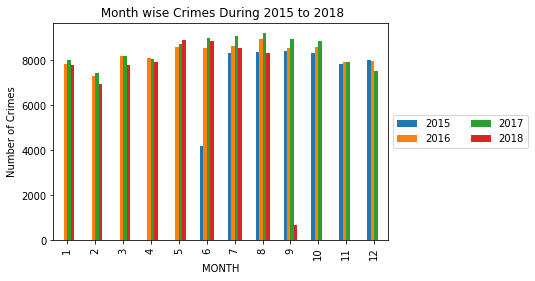

In [ ]:
plt.figure(figsize=(16,12))
crime1.groupby(['MONTH', 'YEAR'])['INCIDENT_NUMBER'].count().unstack().plot(kind = 'bar')
plt.ylabel('Number of Crimes')
plt.title(' Month wise Crimes During 2015 to 2018')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5),ncol=2)
plt.show()

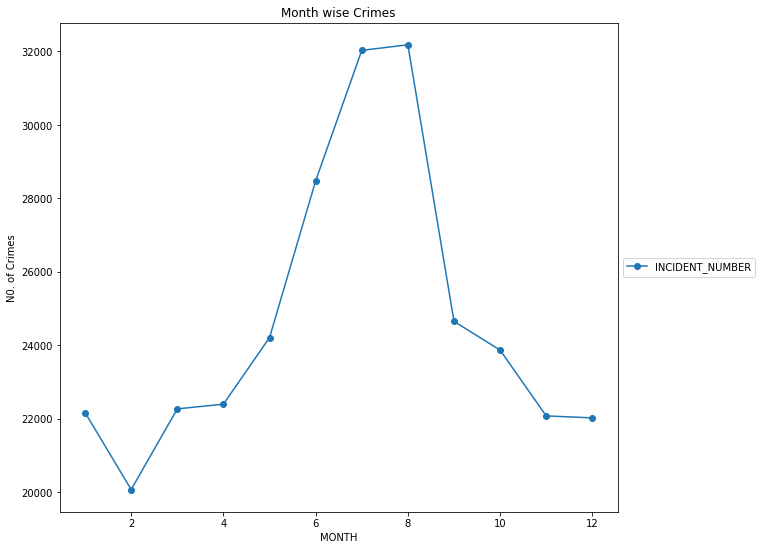

In [ ]:
plt.figure(figsize=(10,9))
crime.groupby(['MONTH'])['INCIDENT_NUMBER'].count().plot(marker = 'o')
plt.ylabel('N0. of Crimes')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5),ncol=2)
plt.title('Month wise Crimes')
plt.show()

This is the monthly trend in 3 years. But the representation is not accurate since the data points were not collected for all three years fully. So the beginning months and ending months don't have data

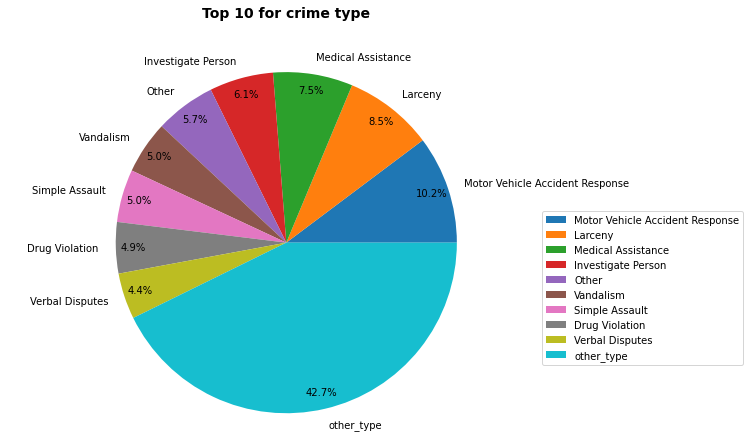

In [ ]:
count=crime['OFFENSE_CODE_GROUP'].value_counts()
groups=list(crime['OFFENSE_CODE_GROUP'].value_counts().index)[:9]
counts=list(count[:9])
counts.append(count.agg(sum)-count[:9].agg('sum'))

groups.append('other_type')
type_dict={"group":groups,
          "counts":counts}
type_dict=pd.DataFrame(type_dict)
qx = type_dict.plot(kind='pie', figsize=(10,7), y='counts', labels=groups,
             autopct='%1.1f%%', pctdistance=0.9, radius=1.2)
plt.legend(loc=0, bbox_to_anchor=(0.95,0.6))

plt.title('Top 10 for crime type', weight='bold', size=14,y=1.08)
plt.axis('equal')
plt.ylabel('')
plt.show()
plt.clf()
plt.close()

Motor Vehicle accident response asn larceney are the largest crimes.

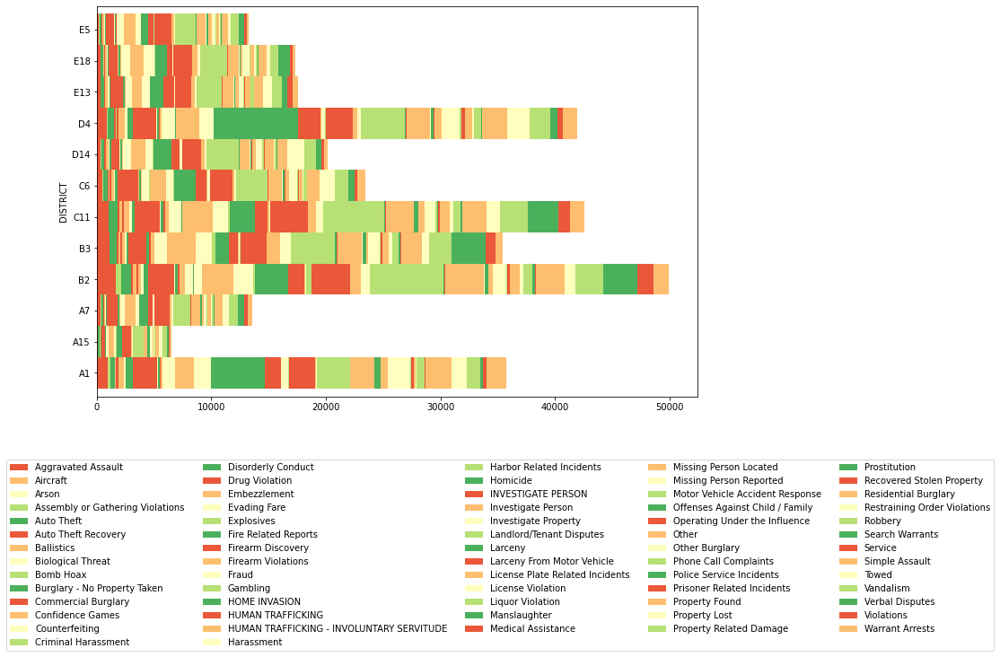

In [ ]:
pd.crosstab(crime1.DISTRICT,crime1.OFFENSE_CODE_GROUP).plot.barh(stacked=True,width=1,color=sns.color_palette('RdYlGn',5))
fig=plt.gcf()
fig.set_size_inches(12,8)
plt.legend(loc="best", bbox_to_anchor=(1.5, -0.15), ncol= 5)
plt.show()

In [ ]:
x_val = crime['Long']
y_val = crime['Lat']

In [ ]:
# sns.ylim(-1, 42.39504158)
# sns.xlim(-71.17867378,-60)

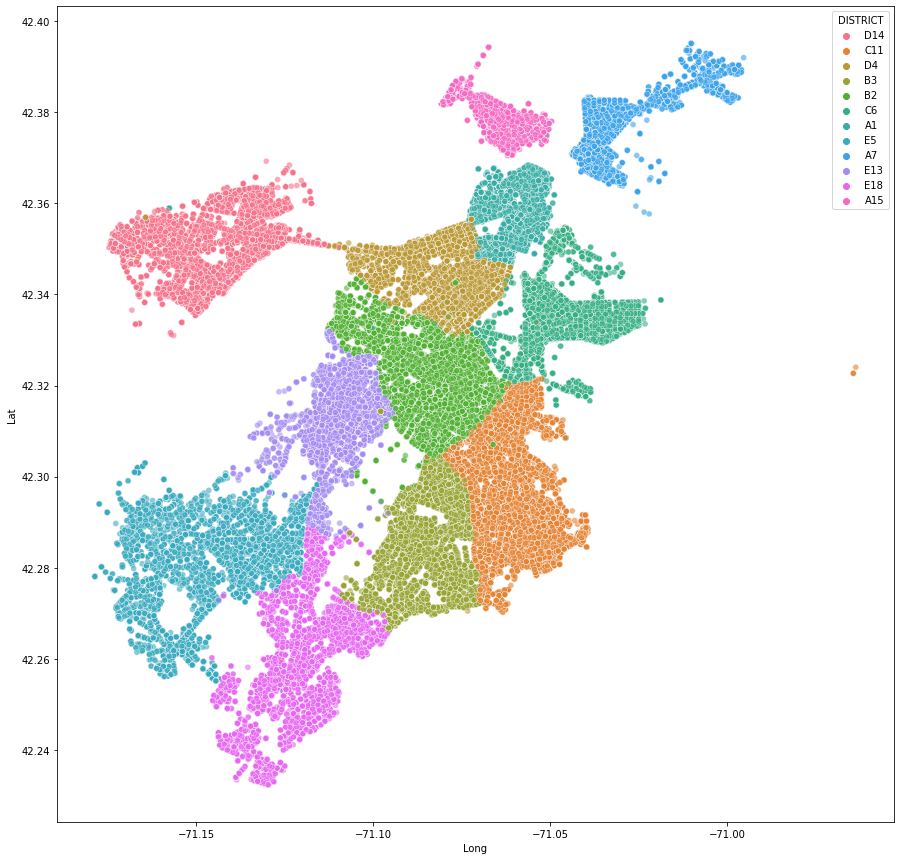

In [ ]:
plt.figure(figsize=(15,15))
sns.scatterplot(x=x_val,y= y_val,alpha=0.6 , hue=crime['DISTRICT'])
plt.show()

# DB  Scan

In [ ]:
crime.head()

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location
0,I182070945,619,Larceny,LARCENY ALL OTHERS,D14,808,NaN,2018-09-02 13:00:00,2018,9,Sunday,13,Part One,LINCOLN ST,42.357791,-71.139371,"(42.35779134, -71.13937053)"
1,I182070943,1402,Vandalism,VANDALISM,C11,347,NaN,2018-08-21 00:00:00,2018,8,Tuesday,0,Part Two,HECLA ST,42.306821,-71.060300,"(42.30682138, -71.06030035)"
2,I182070941,3410,Towed,TOWED MOTOR VEHICLE,D4,151,NaN,2018-09-03 19:27:00,2018,9,Monday,19,Part Three,CAZENOVE ST,42.346589,-71.072429,"(42.34658879, -71.07242943)"
3,I182070940,3114,Investigate Property,INVESTIGATE PROPERTY,D4,272,NaN,2018-09-03 21:16:00,2018,9,Monday,21,Part Three,NEWCOMB ST,42.334182,-71.078664,"(42.33418175, -71.07866441)"
4,I182070938,3114,Investigate Property,INVESTIGATE PROPERTY,B3,421,NaN,2018-09-03 21:05:00,2018,9,Monday,21,Part Three,DELHI ST,42.275365,-71.090361,"(42.27536542, -71.09036101)"


In [ ]:
crime.isnull().sum()

INCIDENT_NUMBER             0
OFFENSE_CODE                0
OFFENSE_CODE_GROUP          0
OFFENSE_DESCRIPTION         0
DISTRICT                 1765
REPORTING_AREA              0
SHOOTING               318054
OCCURRED_ON_DATE            0
YEAR                        0
MONTH                       0
DAY_OF_WEEK                 0
HOUR                        0
UCR_PART                   90
STREET                  10871
Lat                     19999
Long                    19999
Location                    0
dtype: int64

In [ ]:
crime

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location
0,I182070945,619,Larceny,LARCENY ALL OTHERS,D14,808,NaN,2018-09-02 13:00:00,2018,9,Sunday,13,Part One,LINCOLN ST,42.357791,-71.139371,"(42.35779134, -71.13937053)"
1,I182070943,1402,Vandalism,VANDALISM,C11,347,NaN,2018-08-21 00:00:00,2018,8,Tuesday,0,Part Two,HECLA ST,42.306821,-71.060300,"(42.30682138, -71.06030035)"
2,I182070941,3410,Towed,TOWED MOTOR VEHICLE,D4,151,NaN,2018-09-03 19:27:00,2018,9,Monday,19,Part Three,CAZENOVE ST,42.346589,-71.072429,"(42.34658879, -71.07242943)"
3,I182070940,3114,Investigate Property,INVESTIGATE PROPERTY,D4,272,NaN,2018-09-03 21:16:00,2018,9,Monday,21,Part Three,NEWCOMB ST,42.334182,-71.078664,"(42.33418175, -71.07866441)"
4,I182070938,3114,Investigate Property,INVESTIGATE PROPERTY,B3,421,NaN,2018-09-03 21:05:00,2018,9,Monday,21,Part Three,DELHI ST,42.275365,-71.090361,"(42.27536542, -71.09036101)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
319068,I050310906-00,3125,Warrant Arrests,WARRANT ARREST,D4,285,NaN,2016-06-05 17:25:00,2016,6,Sunday,17,Part Three,COVENTRY ST,42.336951,-71.085748,"(42.33695098, -71.08574813)"
319069,I030217815-08,111,Homicide,"MURDER, NON-NEGLIGIENT MANSLAUGHTER",E18,520,NaN,2015-07-09 13:38:00,2015,7,Thursday,13,Part One,RIVER ST,42.255926,-71.123172,"(42.25592648, -71.12317207)"
319070,I030217815-08,3125,Warrant Arrests,WARRANT ARREST,E18,520,NaN,2015-07-09 13:38:00,2015,7,Thursday,13,Part Three,RIVER ST,42.255926,-71.123172,"(42.25592648, -71.12317207)"
319071,I010370257-00,3125,Warrant Arrests,WARRANT ARREST,E13,569,NaN,2016-05-31 19:35:00,2016,5,Tuesday,19,Part Three,NEW WASHINGTON ST,42.302333,-71.111565,"(42.30233307, -71.11156487)"


In [ ]:
crime.dropna(how='any',inplace=True)

In [ ]:

label_encoder = preprocessing.LabelEncoder()
crime['DISTRICT']= label_encoder.fit_transform(crime['DISTRICT'])
label_encoder = preprocessing.LabelEncoder()
crime['DAY_OF_WEEK']= label_encoder.fit_transform(crime['DAY_OF_WEEK'])

label_encoder = preprocessing.LabelEncoder()
crime['STREET']= label_encoder.fit_transform(crime['STREET'])

In [ ]:
X=crime

In [ ]:
X = X.drop('INCIDENT_NUMBER', axis = 1)
X = X.drop('OFFENSE_CODE_GROUP', axis = 1)
X = X.drop('OCCURRED_ON_DATE', axis = 1)
X = X.drop('HOUR', axis = 1)
X = X.drop('SHOOTING', axis = 1)
X = X.drop('UCR_PART', axis = 1)
X = X.drop('OFFENSE_DESCRIPTION', axis = 1)
X = X.drop('Location', axis = 1)

In [ ]:
X1=X.copy()
X = X.drop('Lat', axis = 1)
X = X.drop('Long', axis = 1)

In [ ]:
X

,OFFENSE_CODE,DISTRICT,REPORTING_AREA,YEAR,MONTH,DAY_OF_WEEK,STREET
1295,413,10,540,2018,8,6,161
1860,413,3,183,2018,8,1,99
3259,111,3,312,2018,8,6,163
3260,2662,3,312,2018,8,6,163
4107,413,1,900,2018,8,3,205
...,...,...,...,...,...,...,...
317369,413,3,238,2015,6,2,99
317370,1503,3,238,2015,6,2,99
317371,3125,3,238,2015,6,2,99
317567,413,3,286,2015,6,0,182


In [ ]:
import matplotlib.pyplot as plt

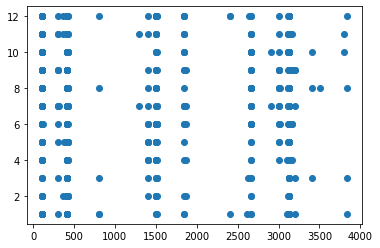

In [ ]:
plt.scatter(X['OFFENSE_CODE'],X['MONTH'])
plt.show()

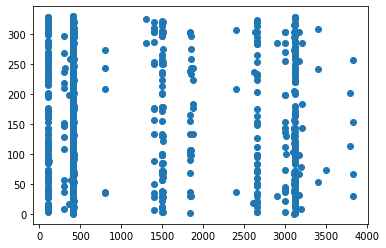

In [ ]:
plt.scatter(X['OFFENSE_CODE'],X['STREET'])
plt.show()

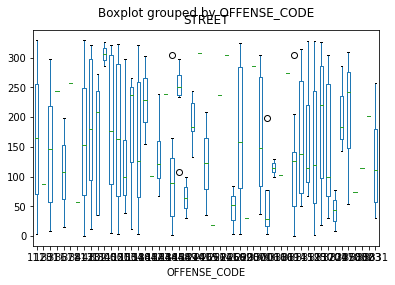

In [ ]:
X.boxplot(by ='OFFENSE_CODE', column =['STREET'], grid = False)

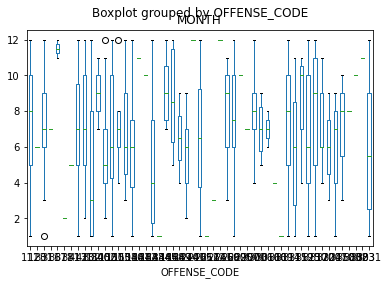

In [ ]:
X.boxplot(by ='OFFENSE_CODE', column =['STREET'], grid = False)

In [ ]:
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

X_normalized = normalize(X_scaled)


X_normalized = pd.DataFrame(X_normalized)

In [ ]:
X_normalized

,0,1,2,3,4,5,6
0,-0.185669,0.707019,0.122973,0.452505,0.081823,0.488948,0.001674
1,-0.250064,-0.312141,-0.484556,0.609446,0.110201,-0.399782,-0.248690
2,-0.343115,-0.296611,-0.237198,0.579125,0.104718,0.625766,0.009835
3,0.503911,-0.272758,-0.218123,0.532552,0.096297,0.575442,0.009044
4,-0.197255,-0.531183,0.647829,0.480742,0.086928,0.018571,0.142259
...,...,...,...,...,...,...,...
966,-0.274297,-0.342390,-0.421638,-0.698061,-0.159585,-0.206350,-0.272790
967,0.169326,-0.350905,-0.432124,-0.715421,-0.163554,-0.211482,-0.279574
968,0.648497,-0.271028,-0.333760,-0.552570,-0.126324,-0.163342,-0.215934
969,-0.243367,-0.303782,-0.289016,-0.619348,-0.141590,-0.595070,0.084916


In [ ]:
pca = PCA(n_components = 2)
X_principal = pca.fit_transform(X_normalized)
X_principal = pd.DataFrame(X_principal)
X_principal.columns = ['P1', 'P2']
print(X_principal.head())

         P1        P2
0  0.217338  0.504960
1  0.356380 -0.510116
2  0.329796 -0.307629
3  0.383809 -0.088836
4  0.238819  0.208959


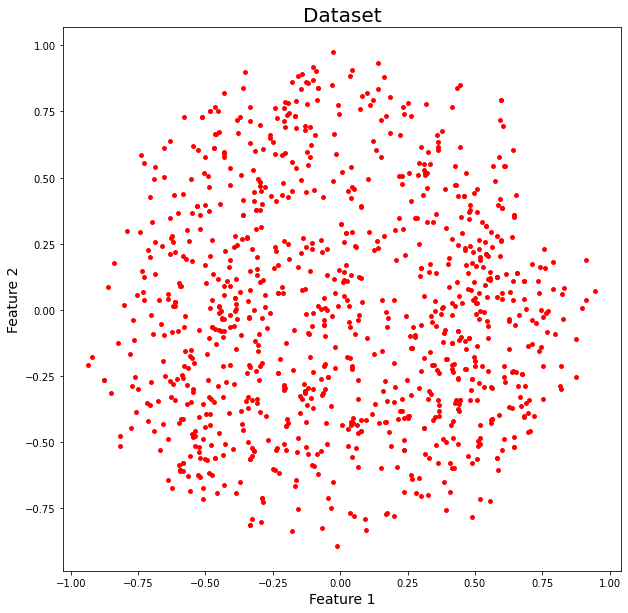

In [ ]:
plt.figure(figsize=(10,10))
plt.scatter(X_principal['P1'],X_principal['P2'],s=15,color='red')
plt.title('Dataset',fontsize=20)
plt.xlabel('Feature 1',fontsize=14)
plt.ylabel('Feature 2',fontsize=14)
plt.show()

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import normalize
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score

In [ ]:
db = DBSCAN(eps = 0.01, min_samples = 2).fit(X_principal)
labels = db.labels_

print("Silhouette Coefficient: %0.3f" %silhouette_score(X_principal,db.labels_))

Silhouette Coefficient: -0.456


In [ ]:

from sklearn.metrics import silhouette_score
from itertools import product
pca_eps_values = np.arange(0.01,0.1,0.01)
pca_min_samples = np.arange(5,25,5)
print(pca_eps_values)
print(pca_min_samples)
pca_dbscan_params = list(product(pca_eps_values, pca_min_samples))
pca_no_of_clusters = []
pca_sil_score = []
pca_epsvalues = []
pca_min_samp = []
for p in pca_dbscan_params:

    pca_dbscan_cluster = DBSCAN(eps=p[0], min_samples=p[1]).fit(X_principal)

    pca_epsvalues.append(p[0])
    pca_min_samp.append(p[1])
    pca_no_of_clusters.append(len(np.unique(pca_dbscan_cluster.labels_)))
    try:
      pca_sil_score.append(silhouette_score(X_principal, np.array(pca_dbscan_cluster.labels_)))
    except ValueError:
      pca_sil_score.append(-1)

pca_eps_min = list(zip(pca_no_of_clusters, pca_sil_score, pca_epsvalues, pca_min_samp))
pca_eps_min_df = pd.DataFrame(pca_eps_min, columns=['no_of_clusters', 'silhouette_score', 'epsilon_values', 'minimum_points'])
pca_eps_min_df

[0.01 0.02 0.03 0.04 0.05 0.06 0.07 0.08 0.09]
[ 5 10 15 20]


,no_of_clusters,silhouette_score,epsilon_values,minimum_points
0,1,-1.000000,0.01,5
1,1,-1.000000,0.01,10
2,1,-1.000000,0.01,15
3,1,-1.000000,0.01,20
4,5,-0.355979,0.02,5
5,1,-1.000000,0.02,10
6,1,-1.000000,0.02,15
7,1,-1.000000,0.02,20
8,25,-0.533943,0.03,5
9,1,-1.000000,0.03,10


In [ ]:
pca_eps_min_df.reset_index()

,index,no_of_clusters,silhouette_score,epsilon_values,minimum_points
0,0,1,-1.000000,0.01,5
1,1,1,-1.000000,0.01,10
2,2,1,-1.000000,0.01,15
3,3,1,-1.000000,0.01,20
4,4,5,-0.355979,0.02,5
5,5,1,-1.000000,0.02,10
6,6,1,-1.000000,0.02,15
7,7,1,-1.000000,0.02,20
8,8,25,-0.533943,0.03,5
9,9,1,-1.000000,0.03,10


In [ ]:
import matplotlib.pyplot as plt


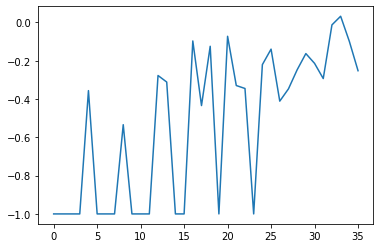

In [ ]:
plt.plot(pca_eps_min_df.index,pca_eps_min_df.silhouette_score)

In [ ]:
db_default = DBSCAN(eps = 0.09, min_samples =10).fit(X_principal)
labels = db_default.labels_

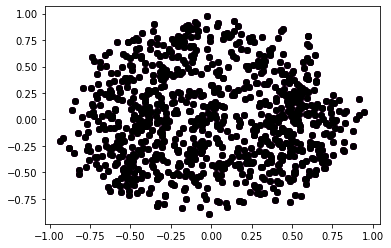

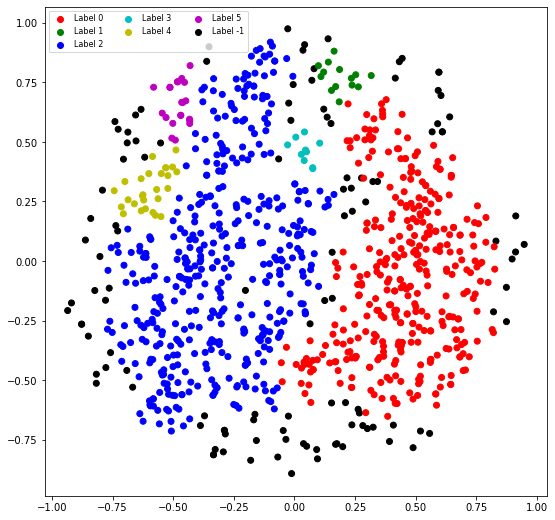

In [ ]:
colours1 = {}
colours1[0] = 'r'
colours1[1] = 'g'
colours1[2] = 'b'
colours1[3] = 'c'
colours1[4] = 'y'
colours1[5] = 'm'
colours1[-1] = 'k'

cvec = [colours1[label] for label in labels]
colors = ['r', 'g', 'b', 'c', 'y', 'm', 'k' ]

r = plt.scatter(
        X_principal['P1'], X_principal['P2'], marker ='o', color = colors[0])
g = plt.scatter(
        X_principal['P1'], X_principal['P2'], marker ='o', color = colors[1])
b = plt.scatter(
        X_principal['P1'], X_principal['P2'], marker ='o', color = colors[2])
c = plt.scatter(
        X_principal['P1'], X_principal['P2'], marker ='o', color = colors[3])
y = plt.scatter(
        X_principal['P1'], X_principal['P2'], marker ='o', color = colors[4])
m = plt.scatter(
        X_principal['P1'], X_principal['P2'], marker ='o', color = colors[5])
k = plt.scatter(
        X_principal['P1'], X_principal['P2'], marker ='o', color = colors[6])

plt.figure(figsize =(9, 9))
plt.scatter(X_principal['P1'], X_principal['P2'], c = cvec)
plt.legend((r, g, b, c, y, m, k),
           ('Label 0', 'Label 1', 'Label 2', 'Label 3 ','Label 4','Label 5', 'Label -1'),
           scatterpoints = 1,
           loc ='upper left',
           ncol = 3,
           fontsize = 8)
plt.show()

All districts have a similar density of data points, the white areas are water-bodies in the City of Boston

# Feature Engineering

In [ ]:
crime.head(5)

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location
0,I182070945,619,Larceny,LARCENY ALL OTHERS,D14,808,0,2018-09-02 13:00:00,2018,9,Sunday,13,Part One,LINCOLN ST,42.357791,-71.139371,"(42.35779134, -71.13937053)"
1,I182070943,1402,Vandalism,VANDALISM,C11,347,0,2018-08-21 00:00:00,2018,8,Tuesday,0,Part Two,HECLA ST,42.306821,-71.060300,"(42.30682138, -71.06030035)"
2,I182070941,3410,Towed,TOWED MOTOR VEHICLE,D4,151,0,2018-09-03 19:27:00,2018,9,Monday,19,Part Three,CAZENOVE ST,42.346589,-71.072429,"(42.34658879, -71.07242943)"
3,I182070940,3114,Investigate Property,INVESTIGATE PROPERTY,D4,272,0,2018-09-03 21:16:00,2018,9,Monday,21,Part Three,NEWCOMB ST,42.334182,-71.078664,"(42.33418175, -71.07866441)"
4,I182070938,3114,Investigate Property,INVESTIGATE PROPERTY,B3,421,0,2018-09-03 21:05:00,2018,9,Monday,21,Part Three,DELHI ST,42.275365,-71.090361,"(42.27536542, -71.09036101)"


Columns that don't add value :
1. Incident Number
2. Offense code
3. Offense description
4. Reporting Area
5. Occured on date
6. Street
7. Location

In [ ]:
crime.drop(['INCIDENT_NUMBER','OFFENSE_CODE','OFFENSE_DESCRIPTION','Lat','Long','REPORTING_AREA','OCCURRED_ON_DATE','STREET','Location'],inplace=True,axis=1)

In [ ]:
crime.head(5)

,OFFENSE_CODE_GROUP,DISTRICT,SHOOTING,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART
0,Larceny,D14,0,2018,9,Sunday,13,Part One
1,Vandalism,C11,0,2018,8,Tuesday,0,Part Two
2,Towed,D4,0,2018,9,Monday,19,Part Three
3,Investigate Property,D4,0,2018,9,Monday,21,Part Three
4,Investigate Property,B3,0,2018,9,Monday,21,Part Three


In [ ]:
for a in crime.columns:
  print(a,end=' ')
  print(crime[a].nunique())

OFFENSE_CODE_GROUP 63
DISTRICT 12
SHOOTING 2
YEAR 4
MONTH 12
DAY_OF_WEEK 7
HOUR 24
UCR_PART 4


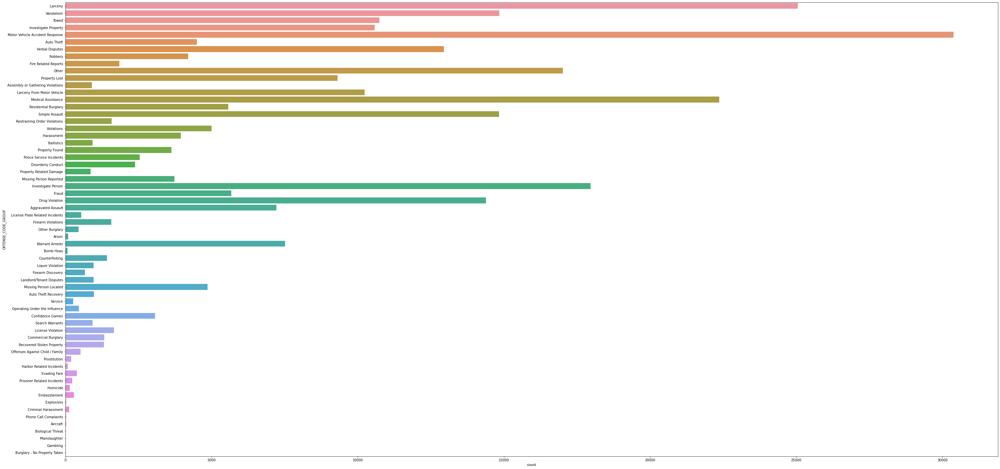

In [ ]:
plt.figure(figsize=(50,25))
sns.countplot(data=crime, y=crime['OFFENSE_CODE_GROUP'])
plt.show()

In [ ]:
count=crime['OFFENSE_CODE_GROUP'].value_counts()
count[34:]

Auto Theft Recovery                 971
Liquor Violation                    969
Landlord/Tenant Disputes            964
Ballistics                          933
Search Warrants                     932
Assembly or Gathering Violations    910
Property Related Damage             862
Firearm Discovery                   671
License Plate Related Incidents     537
Offenses Against Child / Family     524
Operating Under the Influence       466
Other Burglary                      448
Evading Fare                        389
Embezzlement                        295
Service                             262
Prisoner Related Incidents          228
Prostitution                        195
Homicide                            148
Criminal Harassment                 131
Arson                                91
Harbor Related Incidents             88
Bomb Hoax                            71
Phone Call Complaints                31
Aircraft                             30
Explosives                           24


In [ ]:
change_to_others=list(count[10:].keys())

Over a period of 3 years these crimes that have occured less than 1000 counts are all clubbed together into 'others'

In [ ]:
dic = {}
for i in change_to_others:
  dic[i]='Other'

In [ ]:
crime.OFFENSE_CODE_GROUP.replace(to_replace=dic, inplace=True)


### Encoding

In [ ]:
crime.head(2)

,OFFENSE_CODE_GROUP,DISTRICT,SHOOTING,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART
0,Larceny,D14,0,2018,9,Sunday,13,Part One
1,Vandalism,C11,0,2018,8,Tuesday,0,Part Two


In [ ]:
encoded_crime = pd.get_dummies(data =crime, columns = ['DISTRICT',	'SHOOTING'	,'YEAR',	'MONTH',	'DAY_OF_WEEK'	,'HOUR'	,'UCR_PART'])

In [ ]:
encoded_crime

,OFFENSE_CODE_GROUP,DISTRICT_A1,DISTRICT_A15,DISTRICT_A7,DISTRICT_B2,DISTRICT_B3,DISTRICT_C11,DISTRICT_C6,DISTRICT_D14,DISTRICT_D4,DISTRICT_E13,DISTRICT_E18,DISTRICT_E5,SHOOTING_0,SHOOTING_1,YEAR_2015,YEAR_2016,YEAR_2017,YEAR_2018,MONTH_1,MONTH_2,MONTH_3,MONTH_4,MONTH_5,MONTH_6,MONTH_7,MONTH_8,MONTH_9,MONTH_10,MONTH_11,MONTH_12,DAY_OF_WEEK_Friday,DAY_OF_WEEK_Monday,DAY_OF_WEEK_Saturday,DAY_OF_WEEK_Sunday,DAY_OF_WEEK_Thursday,DAY_OF_WEEK_Tuesday,DAY_OF_WEEK_Wednesday,HOUR_0,HOUR_1,HOUR_2,HOUR_3,HOUR_4,HOUR_5,HOUR_6,HOUR_7,HOUR_8,HOUR_9,HOUR_10,HOUR_11,HOUR_12,HOUR_13,HOUR_14,HOUR_15,HOUR_16,HOUR_17,HOUR_18,HOUR_19,HOUR_20,HOUR_21,HOUR_22,HOUR_23,UCR_PART_Other,UCR_PART_Part One,UCR_PART_Part Three,UCR_PART_Part Two
0,Larceny,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0
1,Vandalism,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
2,Towed,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0
3,Other,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0
4,Other,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
319068,Other,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0
319069,Other,0,0,0,0,0,0,0,0,0,0,1,0,1,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0
319070,Other,0,0,0,0,0,0,0,0,0,0,1,0,1,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0
319071,Other,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0


# Random Forest

### Trying for district

In [ ]:
from sklearn.ensemble import RandomForestClassifier
classifier = RandomForestClassifier(n_estimators = 50)
from sklearn.model_selection import train_test_split


In [ ]:
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

In [ ]:
X = encoded_crime.iloc[:, 1:].values
y = encoded_crime.iloc[:, 0].values

In [ ]:
encoded_crime_dist = pd.get_dummies(data =crime, columns = ['OFFENSE_CODE_GROUP',	'SHOOTING'	,'YEAR',	'MONTH',	'DAY_OF_WEEK'	,'HOUR'	,'UCR_PART'])

In [ ]:
X_dist = encoded_crime_dist.iloc[:, 1:].values
y_dist = encoded_crime_dist.iloc[:, 0].values

In [ ]:
X_train_d, X_test_d, y_train_d, y_test_d = train_test_split(X_dist, y_dist, test_size = 0.10)


In [ ]:
classifier.fit(X_train_d, y_train_d)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=50,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [ ]:
y_pred_dist = classifier.predict(X_test_d)

In [ ]:
result = confusion_matrix(y_test_d, y_pred_dist)
print("Confusion Matrix:")
print(result)
result1 = classification_report(y_test_d, y_pred_dist)
print("Classification Report:",)
print (result1)
result2 = accuracy_score(y_test_d, y_pred_dist)
print("Accuracy:",result2)

Confusion Matrix:
[[ 601   41   87  527  337  443  199  153  542  119  121   78]
 [  69   16   14  113   70  102   34   42  100   23   18   13]
 [ 149   19   75  247  153  194   73   54  173   70   48   34]
 [ 471   50  128 1091  563  707  248  223  643  177  225  110]
 [ 335   43   92  693  583  567  217  167  412  154  144   82]
 [ 395   48  127  739  484  796  234  177  525  176  185  110]
 [ 224   28   58  324  235  319  201  142  346   95   97   61]
 [ 239   24   56  357  202  288  131  133  302   77   82   70]
 [ 471   49  113  622  366  474  227  186  821  143  148   97]
 [ 186   17   35  296  181  252   84   95  254  106   74   41]
 [ 189   20   46  297  204  253   91   84  220   64  138   42]
 [ 110   16   34  251  156  204   81   71  172   54   64   81]]
Classification Report:
              precision    recall  f1-score   support

          A1       0.17      0.19      0.18      3248
         A15       0.04      0.03      0.03       614
          A7       0.09      0.06      

### Trying for offense code group

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.10)


In [ ]:
classifier.fit(X_train, y_train)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=50,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [ ]:
y_pred = classifier.predict(X_test)

In [ ]:
result = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(result)
result1 = classification_report(y_test, y_pred)
print("Classification Report:",)
print (result1)
result2 = accuracy_score(y_test,y_pred)
print("Accuracy:",result2)

Confusion Matrix:
[[ 551    0    0    0    0  725   77    0  126    0]
 [   0  194    0  214  341  827    0   90    0  135]
 [   0    0 1237    0    0 1277    0    0    0    0]
 [   0  208    0  321  442  987    0  119    0  144]
 [   0  292    0  408  687 1267    0  177    0  201]
 [ 466  469  989  603  924 8264  488  276  464  306]
 [ 128    0    0    0    0  978  215    0  202    0]
 [   0   95    0  128  210  397    0  189    0   38]
 [ 144    0    0    0    0  950  189    0  214    0]
 [   0  146    0  184  274  513    0   35    0  118]]
Classification Report:
                                 precision    recall  f1-score   support

                 Drug Violation       0.43      0.37      0.40      1479
             Investigate Person       0.14      0.11      0.12      1801
                        Larceny       0.56      0.49      0.52      2514
             Medical Assistance       0.17      0.14      0.16      2221
Motor Vehicle Accident Response       0.24      0.23      0.23

# Naive Bayes For classification

### Offense code group

In [ ]:
from sklearn.naive_bayes import GaussianNB
nb = GaussianNB()


In [ ]:
nb.fit(X_train,y_train)
prediction = nb.predict(X_test)

In [ ]:
from sklearn import metrics

# Model Accuracy, how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(y_test, prediction))

Accuracy: 0.21836521269777012


In [ ]:
result = confusion_matrix(y_test, prediction)
print("Confusion Matrix:")
print(result)
result1 = classification_report(y_test, prediction)
print("Classification Report:",)
print (result1)
result2 = accuracy_score(y_test,prediction)
print("Accuracy:",result2)

Confusion Matrix:
[[1115    0    0    0    0    3  198    0  163    0]
 [   0   78    0   24   33    1    0  167    0 1498]
 [   0    0 2514    0    0    0    0    0    0    0]
 [   0  105    0   47   72    0    0  208    0 1789]
 [   0   97    0   54   82    1    0  372    0 2426]
 [2595  311 3256  113  196  216 1160  607  815 3980]
 [ 759    0    0    0    0    0  488    0  276    0]
 [   0   27    0   22   22    0    0  396    0  590]
 [ 722    0    0    0    0    2  402    0  371    0]
 [   0   18    0   13   11    0    0   62    0 1166]]
Classification Report:
                                 precision    recall  f1-score   support

                 Drug Violation       0.21      0.75      0.33      1479
             Investigate Person       0.12      0.04      0.06      1801
                        Larceny       0.44      1.00      0.61      2514
             Medical Assistance       0.17      0.02      0.04      2221
Motor Vehicle Accident Response       0.20      0.03      0.05

### District

In [ ]:
nb.fit(X_train_d,y_train_d)
prediction_d = nb.predict(X_test_d)

In [ ]:
result = confusion_matrix(y_test_d, prediction_d)
print("Confusion Matrix:")
print(result)
result1 = classification_report(y_test_d, prediction_d)
print("Classification Report:",)
print (result1)
result2 = accuracy_score(y_test_d, prediction_d)
print("Accuracy:",result2)

Confusion Matrix:
[[1852  155   20    5   71   71   39  229  476    0   95  235]
 [ 285   39   11    1   20   17    6   57   55    0   33   90]
 [ 585   78   31    2   74   48   21  122  124    0   58  146]
 [2243  282   77   35  311  145   56  290  495    0  245  457]
 [1584  277   51   22  323   97   37  262  311    0  174  351]
 [1776  307   71   19  279  142   44  335  369    2  215  437]
 [ 978  145   40    3   59   54   34  214  256    0   97  250]
 [ 832  153   25    1   67   41   26  244  239    0  107  226]
 [1751  204   39    6   91   89   40  363  705    1  110  318]
 [ 759  114   25    5   62   42   24  154  163    0   80  193]
 [ 735  119   16    6  100   38   13  119  183    0   93  226]
 [ 534   94   33    2   71   43   17   94  110    0   85  211]]
Classification Report:
              precision    recall  f1-score   support

          A1       0.13      0.57      0.22      3248
         A15       0.02      0.06      0.03       614
          A7       0.07      0.02      

# Using Clustering done in previous review

In [ ]:
from sklearn.cluster import KMeans
from sklearn import metrics
from scipy.spatial.distance import cdist
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import normalize
from sklearn.preprocessing import StandardScaler

In [ ]:
crime = pd.get_dummies(crime)

In [ ]:
distortions = []
inertias = []
mapping1 = {}
mapping2 = {}
K = range(1,10)

for k in K:
	#Building and fitting the model
	kmeanModel = KMeans(n_clusters=k).fit(crime)
	kmeanModel.fit(crime)

	distortions.append(sum(np.min(cdist(crime, kmeanModel.cluster_centers_,
					'euclidean'),axis=1)) / crime.shape[0])
	inertias.append(kmeanModel.inertia_)

	mapping1[k] = sum(np.min(cdist(crime, kmeanModel.cluster_centers_,
				'euclidean'),axis=1)) / crime.shape[0]
	mapping2[k] = kmeanModel.inertia_


In [ ]:
for key,val in mapping1.items():
    print(str(key)+' : '+str(val))

1 : 6.731146097141654
2 : 4.967322592109212
3 : 4.284864152564384
4 : 3.8607918935279346
5 : 3.524613081964936
6 : 3.323445255875577
7 : 3.178793173086877
8 : 3.0499301196019526
9 : 2.9613790805988165


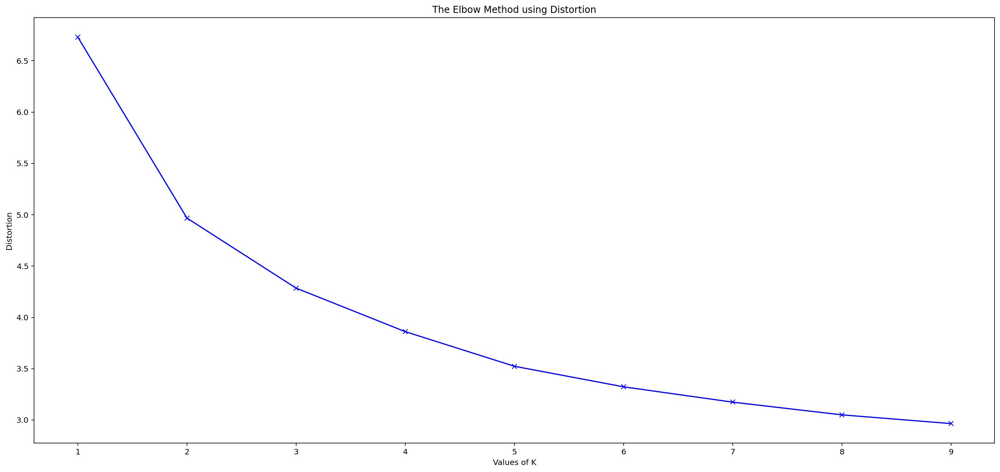

In [ ]:
plt.plot(K, distortions, 'bx-')
plt.xlabel('Values of K')
plt.ylabel('Distortion')
plt.title('The Elbow Method using Distortion')
plt.show()

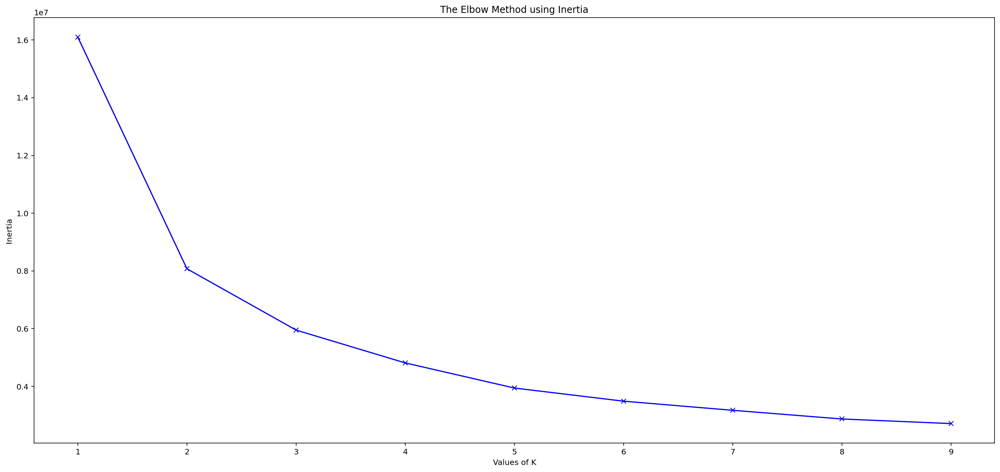

In [ ]:
plt.plot(K, inertias, 'bx-')
plt.xlabel('Values of K')
plt.ylabel('Inertia')
plt.title('The Elbow Method using Inertia')
plt.show()

In [ ]:
cluster=KMeans(n_clusters=4)
crime['cluster']=cluster.fit_predict(crime)

In [ ]:
crime['cluster'].value_counts()


3    104327
2     76604
0     71074
1     44416
Name: cluster, dtype: int64

In [ ]:
crime.iloc[:,:-1]

,SHOOTING,YEAR,MONTH,HOUR,OFFENSE_CODE_GROUP_Drug Violation,OFFENSE_CODE_GROUP_Investigate Person,OFFENSE_CODE_GROUP_Larceny,OFFENSE_CODE_GROUP_Medical Assistance,OFFENSE_CODE_GROUP_Motor Vehicle Accident Response,OFFENSE_CODE_GROUP_Other,OFFENSE_CODE_GROUP_Simple Assault,OFFENSE_CODE_GROUP_Towed,OFFENSE_CODE_GROUP_Vandalism,OFFENSE_CODE_GROUP_Verbal Disputes,DISTRICT_A1,DISTRICT_A15,DISTRICT_A7,DISTRICT_B2,DISTRICT_B3,DISTRICT_C11,DISTRICT_C6,DISTRICT_D14,DISTRICT_D4,DISTRICT_E13,DISTRICT_E18,DISTRICT_E5,DAY_OF_WEEK_Friday,DAY_OF_WEEK_Monday,DAY_OF_WEEK_Saturday,DAY_OF_WEEK_Sunday,DAY_OF_WEEK_Thursday,DAY_OF_WEEK_Tuesday,DAY_OF_WEEK_Wednesday,UCR_PART_Other,UCR_PART_Part One,UCR_PART_Part Three,UCR_PART_Part Two
0,0,2018,9,13,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0
1,0,2018,8,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1
2,0,2018,9,19,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0
3,0,2018,9,21,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0
4,0,2018,9,21,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
319068,0,2016,6,17,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0
319069,0,2015,7,13,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0
319070,0,2015,7,13,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0
319071,0,2016,5,19,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0


# Classifying Based on Cluster

### Random Forest

In [ ]:
X = crime.iloc[:,:-1].values
y =crime.iloc[:,-1].values

In [ ]:
X_train, X_test, y_train, y_test= train_test_split(X, y, test_size = 0.10)


In [ ]:
classifier.fit(X_train, y_train)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=50,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [ ]:
y_pred = classifier.predict(X_test)

In [ ]:
result = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(result)
result1 = classification_report(y_test, y_pred)
print("Classification Report:",)
print (result1)
result2 = accuracy_score(y_test,y_pred)
print("Accuracy:",result2)

Confusion Matrix:
[[ 7090     0     0    14]
 [    0  4426     0     0]
 [    0     0  7727     0]
 [    0     0     0 10386]]
Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      7104
           1       1.00      1.00      1.00      4426
           2       1.00      1.00      1.00      7727
           3       1.00      1.00      1.00     10386

    accuracy                           1.00     29643
   macro avg       1.00      1.00      1.00     29643
weighted avg       1.00      1.00      1.00     29643

Accuracy: 0.9995277131194549


## Naive Bayes

In [ ]:
nb.fit(X_train,y_train)
prediction = nb.predict(X_test)

In [ ]:
result = confusion_matrix(y_test, prediction)
print("Confusion Matrix:")
print(result)
result1 = classification_report(y_test, prediction)
print("Classification Report:",)
print (result1)
result2 = accuracy_score(y_test,prediction)
print("Accuracy:",result2)

Confusion Matrix:
[[6303   10  304  487]
 [   0 3951    0  475]
 [ 233   10 7101  383]
 [ 375  125  389 9497]]
Classification Report:
              precision    recall  f1-score   support

           0       0.91      0.89      0.90      7104
           1       0.96      0.89      0.93      4426
           2       0.91      0.92      0.92      7727
           3       0.88      0.91      0.89     10386

    accuracy                           0.91     29643
   macro avg       0.92      0.90      0.91     29643
weighted avg       0.91      0.91      0.91     29643

Accuracy: 0.9058462368856054


##SVM

In [ ]:
from sklearn.svm import SVC

svclassifier = SVC(kernel='linear')
svclassifier.fit(X_train, y_train)

SVC(C=1.0, break_ties=False, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma='scale', kernel='linear',
    max_iter=-1, probability=False, random_state=None, shrinking=True,
    tol=0.001, verbose=False)

In [ ]:
y_pred = svclassifier.predict(X_test)

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix,accuracy_score
print("Confusion Matrix: \n" ,confusion_matrix(y_test,y_pred))
print("Classification_report\n",classification_report(y_test,y_pred))
print("Accuracy:",accuracy_score(y_test,y_pred))

Confusion Matrix: 
 [[11240     0     0     0]
 [    0  8224     0     0]
 [    0     0  4817     0]
 [    0     0     0  7627]]

               precision    recall  f1-score   support

           0       1.00      1.00      1.00     11240
           1       1.00      1.00      1.00      8224
           2       1.00      1.00      1.00      4817
           3       1.00      1.00      1.00      7627

    accuracy                           1.00     31908
   macro avg       1.00      1.00      1.00     31908
weighted avg       1.00      1.00      1.00     31908

Accuracy: 1.0


# Time Series

## LSTM

In [ ]:
import datetime as dt


In [ ]:
crime_ts= pd.read_csv('https://raw.githubusercontent.com/sahithyasenthil/mldmlab/master/crime.csv', encoding='latin-1')

In [ ]:
crime_ts.SHOOTING=[1 if each=='Y' else 0 for each in crime_ts.SHOOTING]

In [ ]:
crime_ts.dropna(how='any', inplace=True)

In [ ]:
crime_ts.shape

(296573, 17)

In [ ]:
crime_ts.head()

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location
0,I182070945,619,Larceny,LARCENY ALL OTHERS,D14,808,0,2018-09-02 13:00:00,2018,9,Sunday,13,Part One,LINCOLN ST,42.357791,-71.139371,"(42.35779134, -71.13937053)"
1,I182070943,1402,Vandalism,VANDALISM,C11,347,0,2018-08-21 00:00:00,2018,8,Tuesday,0,Part Two,HECLA ST,42.306821,-71.060300,"(42.30682138, -71.06030035)"
2,I182070941,3410,Towed,TOWED MOTOR VEHICLE,D4,151,0,2018-09-03 19:27:00,2018,9,Monday,19,Part Three,CAZENOVE ST,42.346589,-71.072429,"(42.34658879, -71.07242943)"
3,I182070940,3114,Investigate Property,INVESTIGATE PROPERTY,D4,272,0,2018-09-03 21:16:00,2018,9,Monday,21,Part Three,NEWCOMB ST,42.334182,-71.078664,"(42.33418175, -71.07866441)"
4,I182070938,3114,Investigate Property,INVESTIGATE PROPERTY,B3,421,0,2018-09-03 21:05:00,2018,9,Monday,21,Part Three,DELHI ST,42.275365,-71.090361,"(42.27536542, -71.09036101)"


In [ ]:
crime_ts.drop(['INCIDENT_NUMBER','OFFENSE_CODE','OFFENSE_DESCRIPTION','INCIDENT_NUMBER', 'UCR_PART','INCIDENT_NUMBER','REPORTING_AREA','SHOOTING',	'DAY_OF_WEEK',	'HOUR','STREET',	'Lat',	'Long' ,	'Location','YEAR','MONTH'] ,axis=1,inplace=True)

In [ ]:
crime_ts['OCCURRED_ON_DATE'] =   crime_ts['OCCURRED_ON_DATE'].apply(lambda x: dt.datetime.strptime(x,'%Y-%m-%d %H:%M:%S'))
crime_ts['OCCURRED_ON_DATE'] = crime_ts['OCCURRED_ON_DATE'].dt.date


In [ ]:
crime_ts.set_index(['OCCURRED_ON_DATE'],inplace=True,drop=True)

In [ ]:
crime_ts.sort_index(inplace=True)

In [ ]:
crime_ts

,OFFENSE_CODE_GROUP,DISTRICT
OCCURRED_ON_DATE,,
2015-06-15,Investigate Person,B3
2015-06-15,Simple Assault,D14
2015-06-15,Vandalism,E18
2015-06-15,Motor Vehicle Accident Response,D14
2015-06-15,Drug Violation,E18
...,...,...
2018-09-03,Investigate Person,A1
2018-09-03,Verbal Disputes,C11
2018-09-03,Harassment,C11


In [ ]:
df = crime_ts.groupby(['OCCURRED_ON_DATE','DISTRICT']).count()

In [ ]:
df.reset_index(inplace=True)
df.set_index(['OCCURRED_ON_DATE'],inplace=True)

In [ ]:
df.rename({'OFFENSE_CODE_GROUP':'count'},inplace=True,axis=1)

In [ ]:
!pip install tensorflow-gpu

In [ ]:
df = pd.get_dummies(df)

In [ ]:
for a in df.columns:
    df[a] = df[a].astype(float)

In [ ]:
import math

In [ ]:
lim = math.floor(0.9*df.shape[0])

In [ ]:
df_train = df.iloc[:lim , :]
df_test = df.iloc[lim:,:]

In [ ]:
def create_dataset(X, y, time_steps=1):
    #idea of cross validation
    Xs, ys = [], []

    for i in range(len(X) - time_steps):

        v = X.iloc[i:(i + time_steps)].values

        Xs.append(v)

        ys.append(y.iloc[i + time_steps])

    return np.array(Xs), np.array(ys)

In [ ]:
time_steps = 7

# reshape to [samples, time_steps, n_features]

X_train, y_train = create_dataset(df_train, df_train['count'], time_steps)

X_test, y_test = create_dataset(df_test, df_test['count'], time_steps)

print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)

(12691, 7, 13) (12691,)
(1404, 7, 13) (1404,)


In [ ]:
import tensorflow as tf
from tensorflow import keras
from keras.callbacks import EarlyStopping
from keras import backend

In [ ]:
RANDOM_SEED = 42

np.random.seed(RANDOM_SEED)
tf.random.set_seed(RANDOM_SEED)

In [ ]:
def rmse(y_true, y_pred):
	return backend.sqrt(backend.mean(backend.square(y_pred - y_true), axis=-1))


In [ ]:
model = keras.Sequential()

model.add(
  keras.layers.Bidirectional(
    keras.layers.LSTM(units=70,return_sequences=True,input_shape=(X_train.shape[1], X_train.shape[2]))))
# model.add(keras.layers.LSTM(units=128,input_shape=(X_train.shape[1], X_train.shape[2]))
model.add(keras.layers.Bidirectional(keras.layers.LSTM(70)))
model.add(keras.layers.Dropout(rate=0.15))
model.add(keras.layers.Dense(units=1))
model.compile(loss='mean_squared_error', optimizer='adam',metrics=[rmse])

In [ ]:
history = model.fit(

    X_train, y_train,

    epochs=10,

    batch_size=50,

    validation_split=0.1,

    shuffle=False

)

Epoch 1/10
229/229 [==============================] - 2s 10ms/step - loss: 37.2097 - rmse: 4.5804 - val_loss: 38.2958 - val_rmse: 4.7173
Epoch 2/10
229/229 [==============================] - 2s 10ms/step - loss: 37.0722 - rmse: 4.5772 - val_loss: 38.2033 - val_rmse: 4.7062
Epoch 3/10
229/229 [==============================] - 2s 10ms/step - loss: 36.7750 - rmse: 4.5411 - val_loss: 37.5973 - val_rmse: 4.6781
Epoch 4/10
229/229 [==============================] - 2s 11ms/step - loss: 36.7610 - rmse: 4.5615 - val_loss: 37.9210 - val_rmse: 4.6906
Epoch 5/10
229/229 [==============================] - 2s 10ms/step - loss: 36.8567 - rmse: 4.5621 - val_loss: 37.9523 - val_rmse: 4.6896
Epoch 6/10
229/229 [==============================] - 2s 10ms/step - loss: 36.5506 - rmse: 4.5394 - val_loss: 38.5264 - val_rmse: 4.7166
Epoch 7/10
229/229 [==============================] - 2s 10ms/step - loss: 36.6292 - rmse: 4.5382 - val_loss: 37.8660 - val_rmse: 4.6793
Epoch 8/10
229/229 [=====================

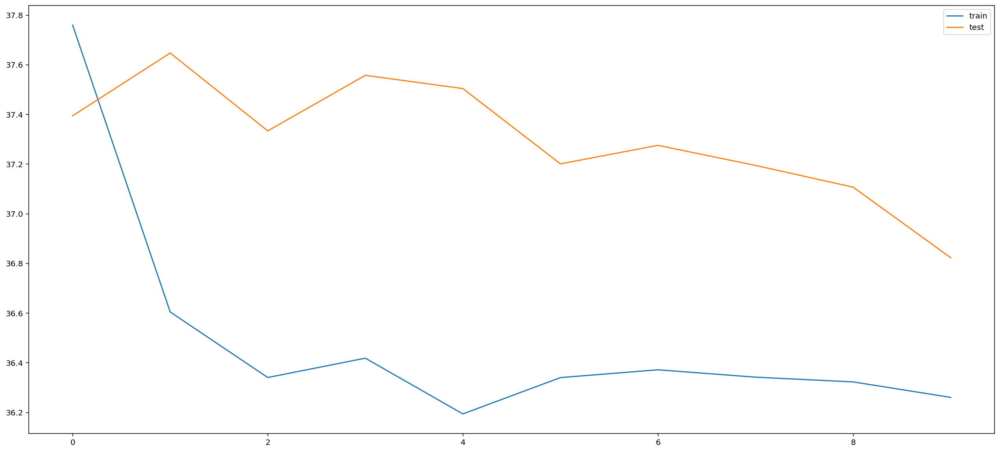

In [ ]:
plt.plot(history.history['loss'], label='train')
plt.plot(history.history['val_loss'], label='test')
plt.legend();

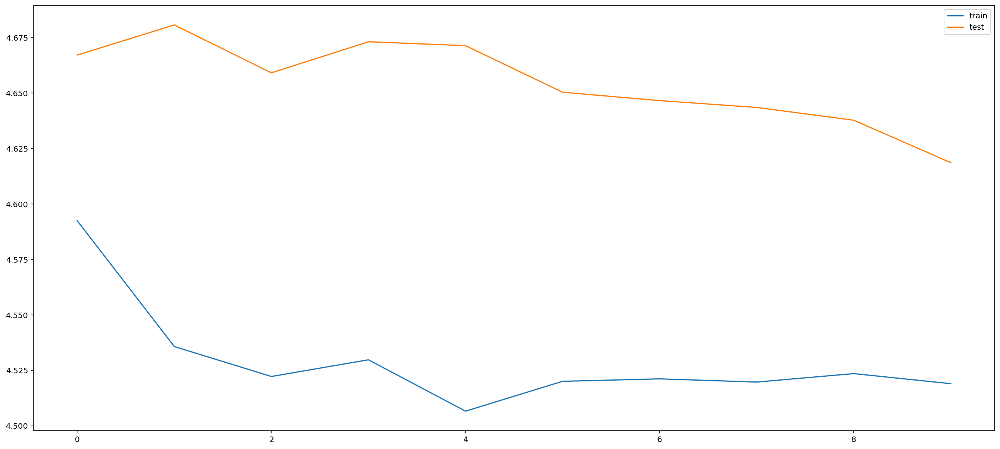

In [ ]:
plt.plot(history.history['rmse'], label='train')
plt.plot(history.history['val_rmse'], label='test')
plt.legend();

In [ ]:
y_pred = model.predict(X_test)

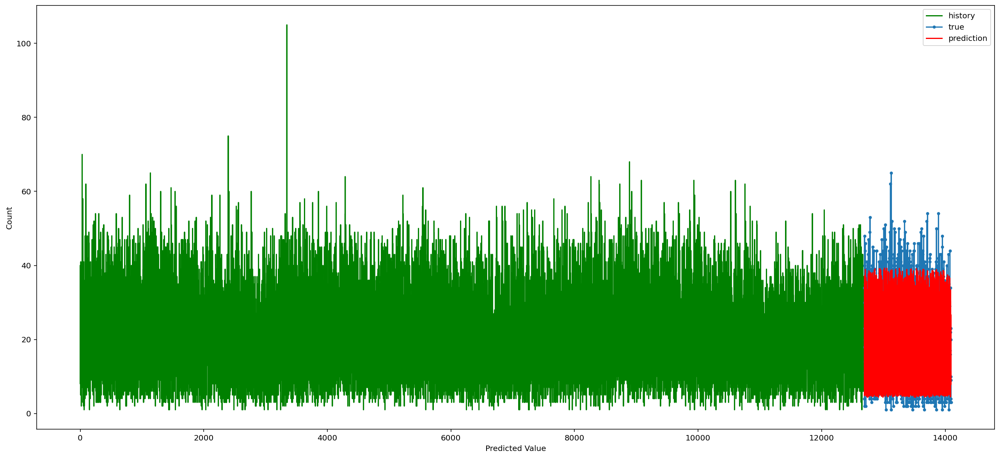

In [ ]:
plt.plot(np.arange(0, len(y_train)), y_train.flatten(), 'g', label="history")
plt.plot(np.arange(len(y_train), len(y_train) + len(y_test)), y_test.flatten(), marker='.', label="true")
plt.plot(np.arange(len(y_train), len(y_train) + len(y_test)), y_pred.flatten(), 'r', label="prediction")
plt.ylabel('Count')
plt.xlabel('Predicted Value')
plt.legend()
plt.show();

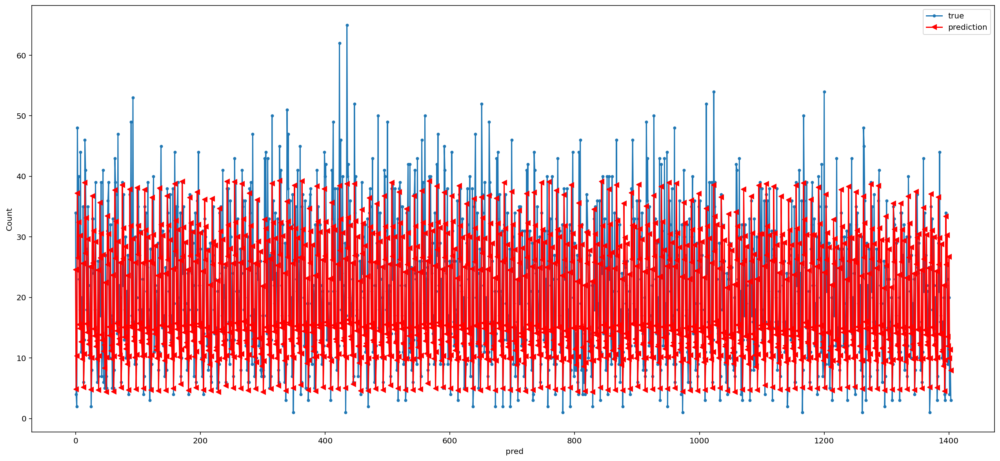

In [ ]:
plt.plot(y_test, marker='.', label="true")
plt.plot(y_pred, 'r',marker='<', label="prediction")
plt.ylabel('Count')
plt.xlabel(' pred')
plt.legend()
plt.show();

It captures the seasonality and trends appropriately, but fails to predict the outliers. It captures the peak, but does not quiete reach the peak or the trough

In [ ]:
eval = model.evaluate(X_test,y_test)

44/44 [==============================] - 0s 4ms/step - loss: 40.4696 - rmse: 4.8079


In [ ]:
model.summary()

Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
bidirectional_8 (Bidirection (None, 7, 140)            47040     
_________________________________________________________________
bidirectional_9 (Bidirection (None, 140)               118160    
_________________________________________________________________
dropout_4 (Dropout)          (None, 140)               0         
_________________________________________________________________
dense_4 (Dense)              (None, 1)                 141       
Total params: 165,341
Trainable params: 165,341
Non-trainable params: 0
_________________________________________________________________


The LSTM model although doesn't give the perfect prediction, it still manages to capture the trend and seasonality. It only fails to reach the troughs and peaks fully.

## ARIMA Forecast


In [ ]:
import warnings
import itertools
import sklearn
import scipy
import seaborn as sns
from matplotlib import pyplot as plt
import matplotlib.ticker as ticker
import statsmodels.api as sm
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.arima_model import ARMA
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.stattools import adfuller
import statsmodels.api as sm
from scipy.spatial.distance import euclidean
import sys
from sklearn.preprocessing import MinMaxScaler
import math


/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [ ]:
Rawdata

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location
0,I182070945,619,Larceny,LARCENY ALL OTHERS,D14,808,NaN,2018-09-02 13:00:00,2018,9,Sunday,13,Part One,LINCOLN ST,42.357791,-71.139371,"(42.35779134, -71.13937053)"
1,I182070943,1402,Vandalism,VANDALISM,C11,347,NaN,2018-08-21 00:00:00,2018,8,Tuesday,0,Part Two,HECLA ST,42.306821,-71.060300,"(42.30682138, -71.06030035)"
2,I182070941,3410,Towed,TOWED MOTOR VEHICLE,D4,151,NaN,2018-09-03 19:27:00,2018,9,Monday,19,Part Three,CAZENOVE ST,42.346589,-71.072429,"(42.34658879, -71.07242943)"
3,I182070940,3114,Investigate Property,INVESTIGATE PROPERTY,D4,272,NaN,2018-09-03 21:16:00,2018,9,Monday,21,Part Three,NEWCOMB ST,42.334182,-71.078664,"(42.33418175, -71.07866441)"
4,I182070938,3114,Investigate Property,INVESTIGATE PROPERTY,B3,421,NaN,2018-09-03 21:05:00,2018,9,Monday,21,Part Three,DELHI ST,42.275365,-71.090361,"(42.27536542, -71.09036101)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
319068,I050310906-00,3125,Warrant Arrests,WARRANT ARREST,D4,285,NaN,2016-06-05 17:25:00,2016,6,Sunday,17,Part Three,COVENTRY ST,42.336951,-71.085748,"(42.33695098, -71.08574813)"
319069,I030217815-08,111,Homicide,"MURDER, NON-NEGLIGIENT MANSLAUGHTER",E18,520,NaN,2015-07-09 13:38:00,2015,7,Thursday,13,Part One,RIVER ST,42.255926,-71.123172,"(42.25592648, -71.12317207)"
319070,I030217815-08,3125,Warrant Arrests,WARRANT ARREST,E18,520,NaN,2015-07-09 13:38:00,2015,7,Thursday,13,Part Three,RIVER ST,42.255926,-71.123172,"(42.25592648, -71.12317207)"
319071,I010370257-00,3125,Warrant Arrests,WARRANT ARREST,E13,569,NaN,2016-05-31 19:35:00,2016,5,Tuesday,19,Part Three,NEW WASHINGTON ST,42.302333,-71.111565,"(42.30233307, -71.11156487)"


In [ ]:
 # Split 'OCCURRED_ON_DATE' colume into 'DATE' and 'Time'. 'Date' will give us the exact date of the crime
Rawdata[["DATE","TIME"]]=Rawdata['OCCURRED_ON_DATE'].str.split(" ",expand=True)

Rawdata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 319073 entries, 0 to 319072
Data columns (total 19 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   INCIDENT_NUMBER      319073 non-null  object 
 1   OFFENSE_CODE         319073 non-null  int64  
 2   OFFENSE_CODE_GROUP   319073 non-null  object 
 3   OFFENSE_DESCRIPTION  319073 non-null  object 
 4   DISTRICT             317308 non-null  object 
 5   REPORTING_AREA       319073 non-null  object 
 6   SHOOTING             1019 non-null    object 
 7   OCCURRED_ON_DATE     319073 non-null  object 
 8   YEAR                 319073 non-null  int64  
 9   MONTH                319073 non-null  int64  
 10  DAY_OF_WEEK          319073 non-null  object 
 11  HOUR                 319073 non-null  int64  
 12  UCR_PART             318983 non-null  object 
 13  STREET               308202 non-null  object 
 14  Lat                  299074 non-null  float64
 15  Long             

In this EDA, let's use 'DISTRICT', 'DATE' columes very frequently.

In [ ]:
# plot line chart
def lineplt(x,y,xlabel,ylabel,title,size,tick_spacing):
    fig,ax=plt.subplots(figsize = size)
    plt.plot(x,y)
    ax.xaxis.set_major_locator(ticker.MultipleLocator(tick_spacing))
    plt.xlabel(xlabel,fontsize = 15)
    plt.ylabel(ylabel,fontsize = 15)
    plt.title(title,fontsize = 20)
    plt.show()

# Create 2 columes DateFrame
def createdf(c1,d1,c2,d2):
    dic = {c1:d1,c2:d2}
    df = pd.DataFrame(dic)
    return df

# Plot histogram
def plthis(d,bin, title):
    plt.figure(figsize=(10,8))
    plt.hist(d, bins=bin)
    plt.title(title, fontsize = 20)
    plt.show()

Checking if frequency of crimes have any pattern


In [ ]:
# Put Date and Count into a new Dataframe
c = createdf("Date",Rawdata["DATE"].value_counts().index,"Count",Rawdata["DATE"].value_counts())

c= c.reindex(idx, fill_value = 0) # Tho crime is a daily affair in BOSTON


# c is the total number of crimes per day
c.head(5)

,Date,Count
2016-09-01,2016-09-01,378
2017-09-01,2017-09-01,376
2018-06-15,2018-06-15,372
2017-09-22,2017-09-22,368
2017-08-04,2017-08-04,361


Refering to the distribution of the Counts of Crimes by date

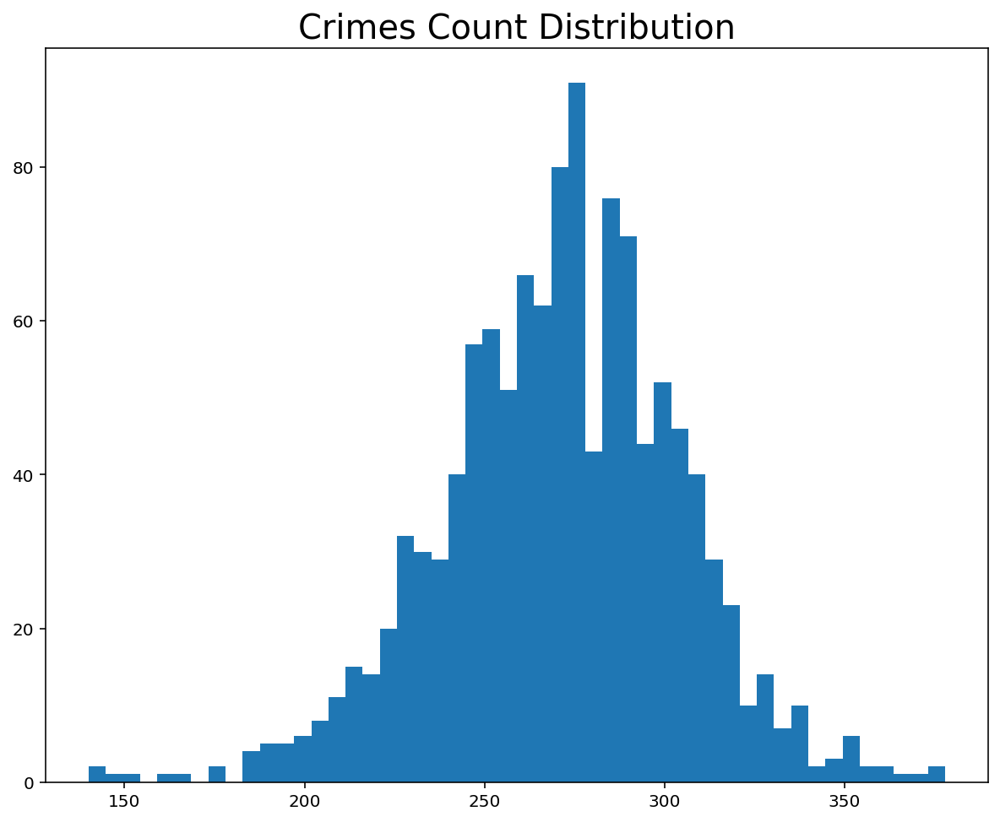

In [ ]:
plthis(c["Count"],50, "Crimes Count Distribution")

In [ ]:
print('skewness is ' + str(c['Count'].skew()))
print('kurtosis is ' + str(c['Count'].kurt()))

skewness is -0.23642018110351762
kurtosis is 0.6916671057308545


The Skewness is negative means that the distribution is left skewed, but not that much.
The kurtosis is greater than 0 means that the peak of the distribution is sharper than a standard normal distribution.

In [ ]:
bin=pd.cut(c["Count"],50)
fre= createdf("Bin",bin.value_counts().index,"Count",bin.value_counts())
fre_sort = fre.sort_values(by = "Bin", ascending = True)


In [ ]:
#
(_,p) = scipy.stats.shapiro(fre_sort["Count"])
print('p-value of Shapiro-Wilk test is  ' + str(p))
#
(_,p) = scipy.stats.kstest(fre_sort["Count"],'norm')
print('p-value Kolmogorov-Smirnov test is ' + str(p))

p-value of Shapiro-Wilk test is  5.61330216442002e-06
p-value Kolmogorov-Smirnov test is 1.2640912235225629e-34


In [ ]:
# distribution is Significantly different from normal distribution

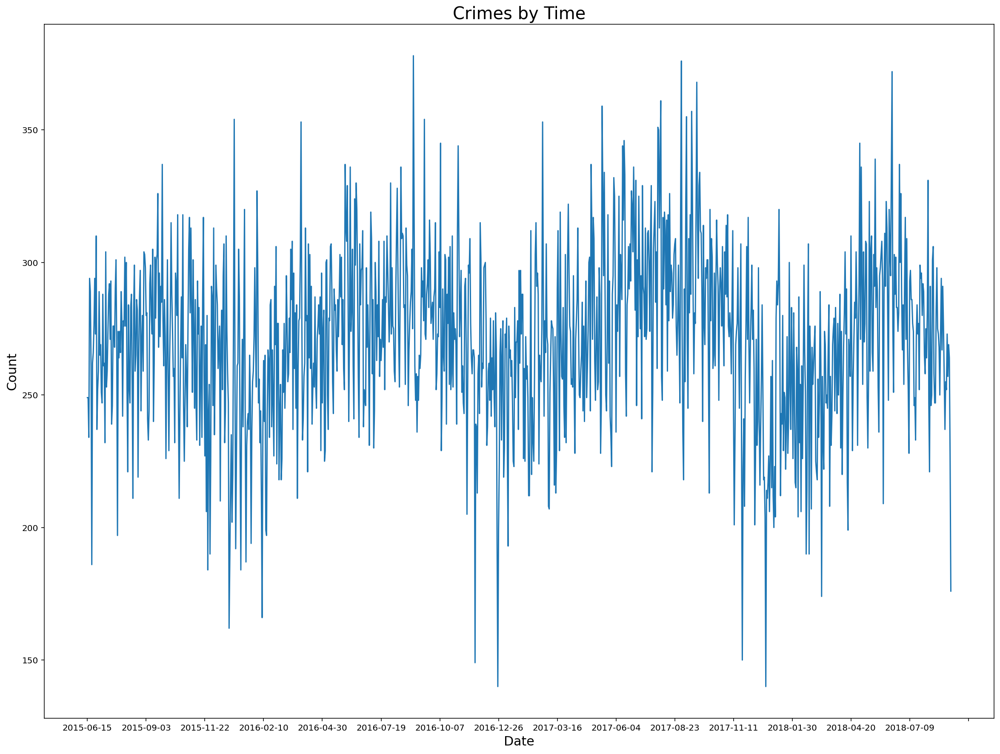

In [ ]:
# Distribution of Crimes by Time
c=c.sort_values(by="Date",ascending = True)
lineplt(c["Date"],c["Count"],"Date","Count","Crimes by Time",(20,15),80)

In [ ]:
# pattern of peaks and troughs like sin function

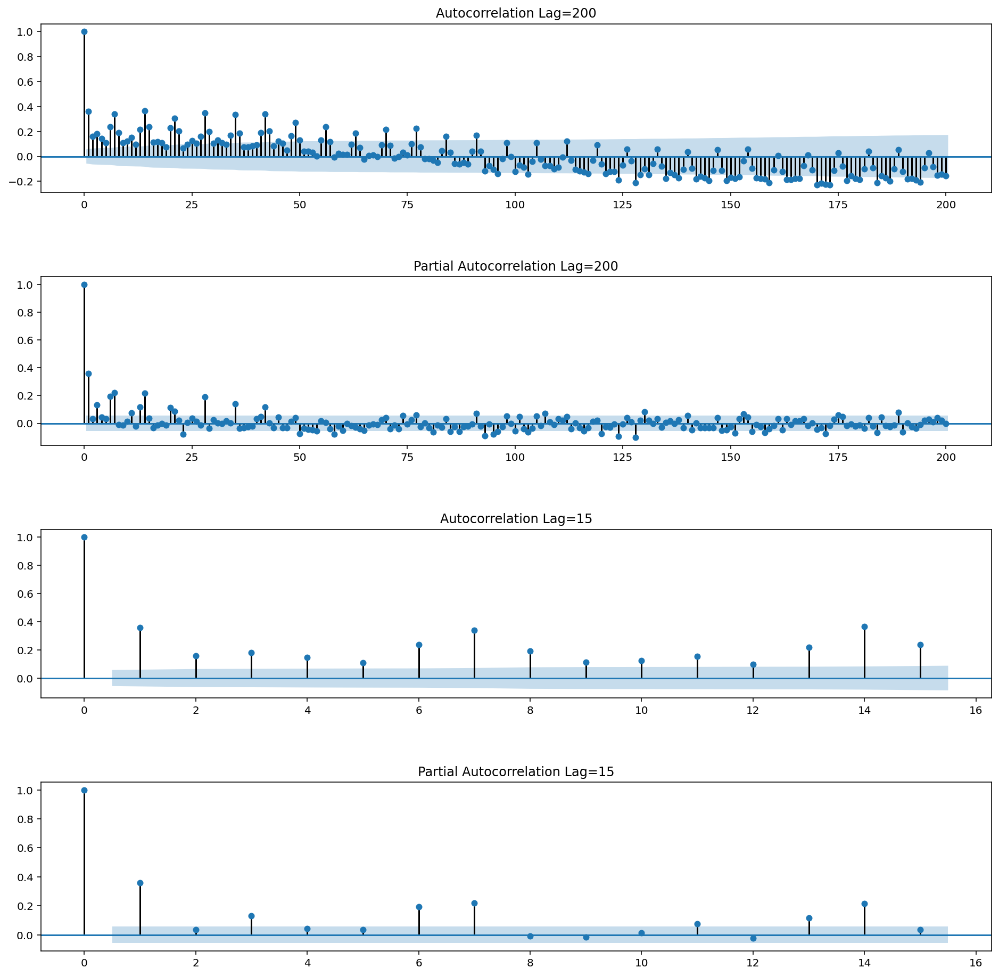

In [ ]:
fig = plt.figure(figsize=(16,16))
ax1 = fig.add_subplot(411)
fig = plot_acf(c["Count"],lags=200,ax=ax1)
plt.title('Autocorrelation Lag=200')
ax2 = fig.add_subplot(412)
fig = plot_pacf(c["Count"],lags=200,ax=ax2)
plt.title('Partial Autocorrelation Lag=200')
ax3 = fig.add_subplot(413)
fig = plot_acf(c["Count"],lags=15,ax=ax3)
plt.title('Autocorrelation Lag=15')
ax4 = fig.add_subplot(414)
fig = plot_pacf(c["Count"],lags=15,ax=ax4)
plt.title('Partial Autocorrelation Lag=15')
plt.subplots_adjust(left=None, bottom=None, right=None, top=None,
                wspace=None, hspace=0.5)
plt.show()

In [ ]:
#(1) From lag 1 to lag 100, the correlation is positive and from lag 100 to lag 200, the correlation is negative. So around every 100 days, the correlation will be reversed. This can describe the "Sin" shape.
#(2) When we make the lag shorter, we can see more details about the correlation. The partial correlations are significant when lag 1, lag 6 and lag 7. So we can conclude that the crimes are correlated with yesterday and the same day in last week.

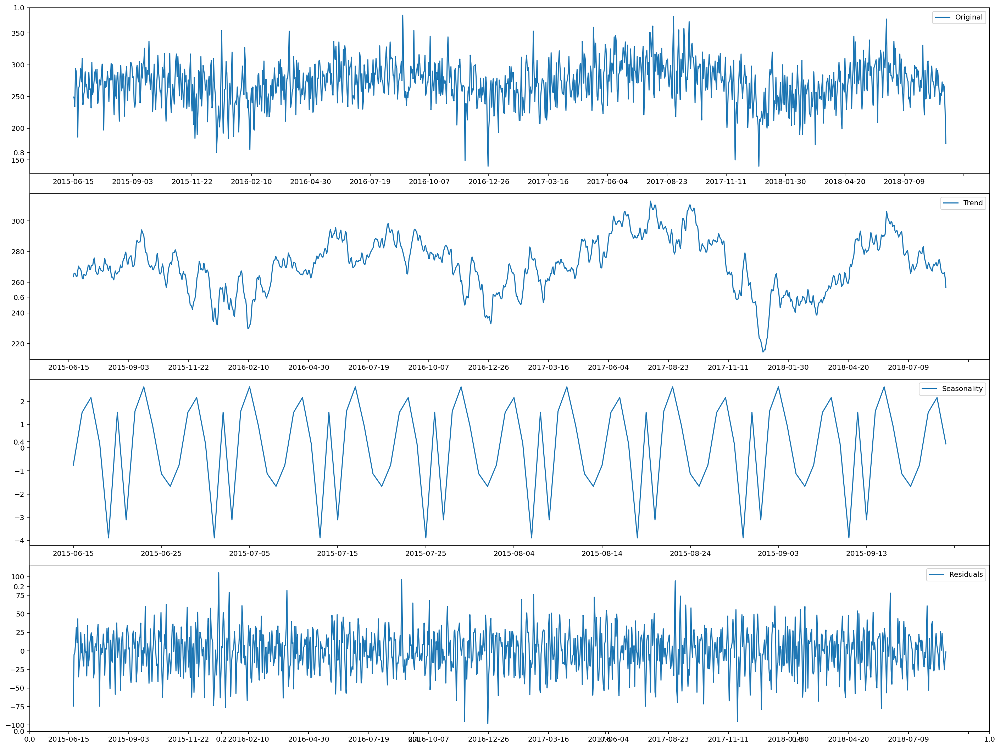

In [ ]:
res = sm.tsa.seasonal_decompose(c['Count'],freq=12,model="additive")

trend = res.trend
seasonal = res.seasonal
residual = res.resid

fig,ax=plt.subplots(figsize = (20,15))
ax1 = fig.add_subplot(411)
ax1.xaxis.set_major_locator(ticker.MultipleLocator(80))
ax1.plot(c['Count'], label='Original')
ax1.legend(loc='best')
ax2 = fig.add_subplot(412)
ax2.xaxis.set_major_locator(ticker.MultipleLocator(80))
ax2.plot(trend, label='Trend')
ax2.legend(loc='best')
ax3 = fig.add_subplot(413)
ax3.xaxis.set_major_locator(ticker.MultipleLocator(10))
ax3.plot(seasonal[:100],label='Seasonality')
ax3.legend(loc='best')
ax4 = fig.add_subplot(414)
ax4.xaxis.set_major_locator(ticker.MultipleLocator(80))
ax4.plot(residual, label='Residuals')
ax4.legend(loc='best')
plt.tight_layout()

In [ ]:
#looks like the time series is not stationary

ADF Test

In [ ]:
def test_stationarity(series,mlag = 365, lag = None,):
    print('ADF Test Result')
    res = adfuller(series, maxlag = mlag, autolag = lag)
    output = pd.Series(res[0:4],index = ['Test Statistic', 'p value', 'used lag', 'Number of observations used'])
    for key, value in res[4].items():
        output['Critical Value ' + key] = value
    print(output)


test_stationarity(c['Count'],lag = 'AIC')

ADF Test Result
Test Statistic                   -2.237273
p value                           0.192997
used lag                         34.000000
Number of observations used    1142.000000
Critical Value 1%                -3.436089
Critical Value 5%                -2.864074
Critical Value 10%               -2.568119
dtype: float64


In [ ]:
#used lag is 34 , p value is 0.19 the time series is non-stationary.

### ARIMA Model

In [ ]:
# the data is not stationary, we need to do first difference to the date in order to make it stationary.

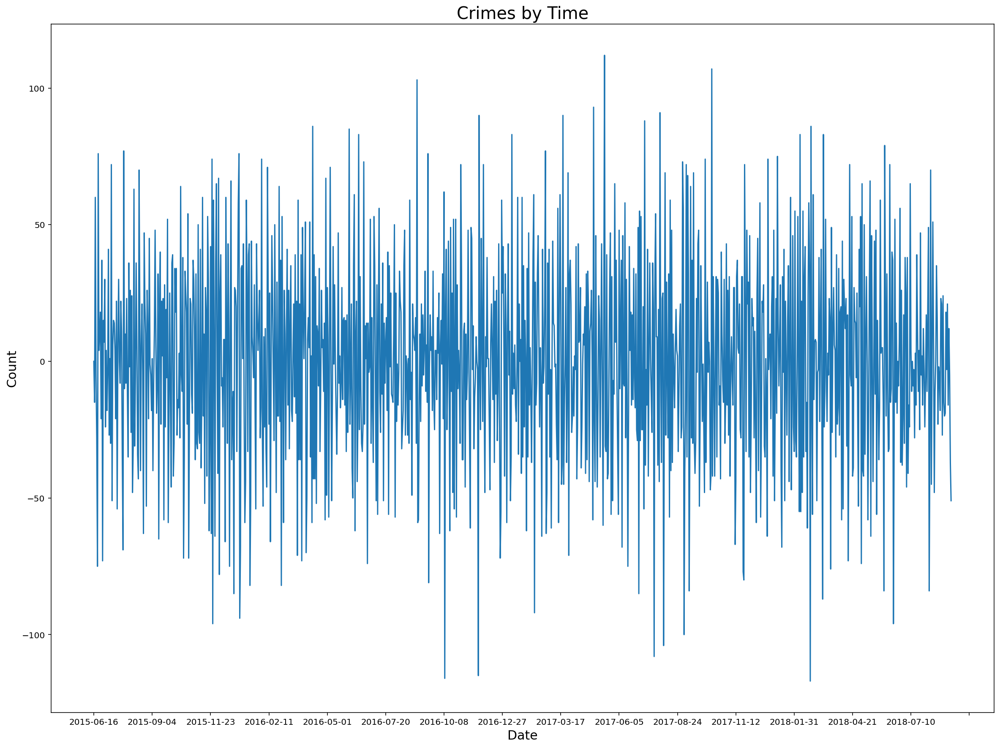

Average= -0.06207482993197279
Std= 37.349601593334036
SE= 1.0891364999989281
ADF Test Result
Test Statistic                -9.988185e+00
p value                        2.029010e-17
used lag                       3.300000e+01
Number of observations used    1.142000e+03
Critical Value 1%             -3.436089e+00
Critical Value 5%             -2.864074e+00
Critical Value 10%            -2.568119e+00
dtype: float64
None


In [ ]:
d1 = c.copy()
d1['Count'] = d1['Count'].diff(1)
d1 = d1.dropna()
lineplt(d1["Date"],d1["Count"],"Date","Count","Crimes by Time",(20,15),80)
print('Average= '+str(d1['Count'].mean()))
print('Std= ' + str(d1['Count'].std()))
print('SE= ' + str(d1['Count'].std()/math.sqrt(len(d1))))
print(test_stationarity(d1['Count'],lag = 'AIC'))

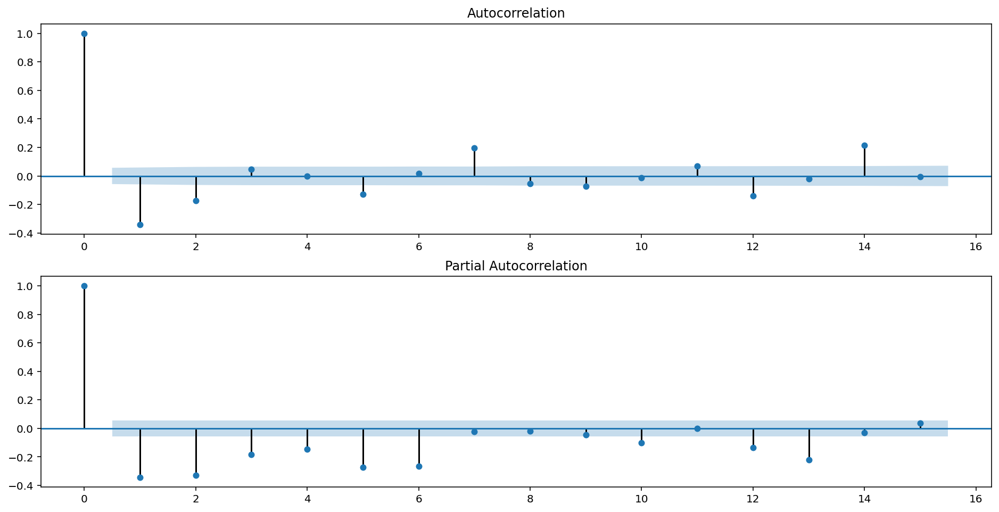

In [ ]:
#The Time series is stational after first differencing since p value changes for less lag

fig_2 = plt.figure(figsize=(16,8))
ax1_2 = fig_2.add_subplot(211)
fig_2 = plot_acf(d1["Count"],lags=15,ax=ax1_2)
ax2_2 = fig_2.add_subplot(212)
fig_2 = plot_pacf(d1["Count"],lags=15,ax=ax2_2)

In [ ]:
#The Autocorrelation and Partial Autocorrelation charts are not very perfect. We can see there is a seasonal pattern every 7 days.

In [ ]:
timeseries = c['Count']
p,d,q = (4,1,2)
arma_mod = ARMA(timeseries,(p,d,q) ).fit()
summary = (arma_mod.summary2(alpha=.05, float_format="%.8f"))
print(summary)

/usr/local/lib/python3.6/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                           Results: ARMA
Model:              ARMA             BIC:                 11366.3482
Dependent Variable: Count            Log-Likelihood:      -5658.4   
Date:               2020-11-03 06:59 Scale:               1.0000    
No. Observations:   1177             Method:              css-mle   
Df Model:           6                Sample:              06-15-2015
Df Residuals:       1171                                  09-03-2018
Converged:          1.0000           S.D. of innovations: 29.614    
No. Iterations:     34.0000          HQIC:                11344.237 
AIC:                11330.8531                                      
---------------------------------------------------------------------
              Coef.    Std.Err.     t      P>|t|    [0.025    0.975] 
---------------------------------------------------------------------
const        269.9610    5.4203   49.8054  0.0000  259.3374  280.5846
ar.L1.Count    1.2068    0.0322   37.5186  0.0000    1.143

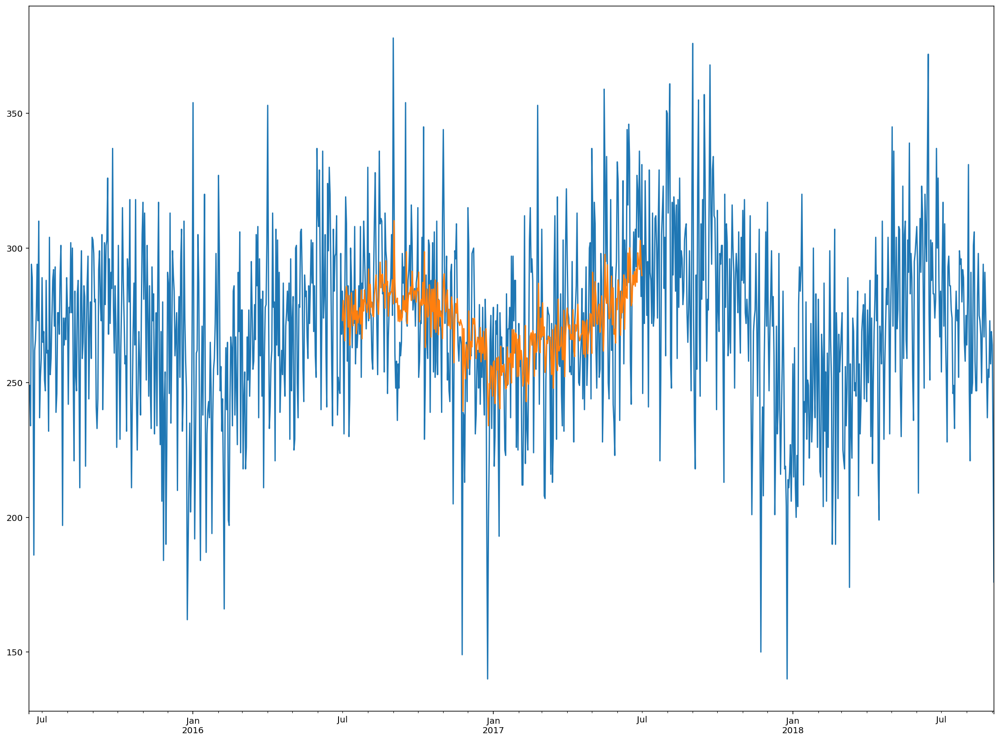

In [ ]:
predict_data = arma_mod.predict(start='2016-07-01', end='2017-07-01', dynamic = False)
timeseries.index = pd.DatetimeIndex(timeseries.index)
fig, ax = plt.subplots(figsize=(20, 15))
ax = timeseries.plot(ax=ax)
predict_data.plot(ax=ax)
plt.show()

In [ ]:
#the yellow line is the prediction of daily crimes. It looks the predictions are always under estimated.It could because the seasonal correlation. So we need to use another model called SARIMA model.

### SARIMA Model

In [ ]:
p = d = q = range(0, 2)

# Generate all different combinations of p, q and q triplets
pdq = list(itertools.product(p, d, q))

seasonal_pdq = [(x[0], x[1], x[2], 7) for x in list(itertools.product(p, d, q))]

print('Examples of parameter combinations for Seasonal ARIMA...')
print('SARIMAX: {} x {}'.format(pdq[1], seasonal_pdq[1]))
print('SARIMAX: {} x {}'.format(pdq[1], seasonal_pdq[2]))
print('SARIMAX: {} x {}'.format(pdq[2], seasonal_pdq[3]))
print('SARIMAX: {} x {}'.format(pdq[2], seasonal_pdq[4]))


res = pd.DataFrame(columns = ['order', 'seasonal_order', 'AIC'])


warnings.filterwarnings("ignore")
for param in pdq:
    for param_seasonal in seasonal_pdq:
        try:
            mod = SARIMAX(c['Count'],order=param,seasonal_order=param_seasonal)
            results = mod.fit()
            data = {'order': param, 'seasonal_order': param_seasonal, 'AIC':results.aic}
#             print('ARIMA{}x{}7 - AIC:{}'.format(param, param_seasonal, results.aic))
            res = res.append(data,ignore_index=True)
        except:
            continue
res = res.sort_values(by = 'AIC', ascending = True)
print(res.head(5))


Examples of parameter combinations for Seasonal ARIMA...
SARIMAX: (0, 0, 1) x (0, 0, 1, 7)
SARIMAX: (0, 0, 1) x (0, 1, 0, 7)
SARIMAX: (0, 1, 0) x (0, 1, 1, 7)
SARIMAX: (0, 1, 0) x (1, 0, 0, 7)
        order seasonal_order           AIC
63  (1, 1, 1)   (1, 1, 1, 7)  11001.434020
59  (1, 1, 1)   (0, 1, 1, 7)  11002.243001
47  (1, 0, 1)   (1, 1, 1, 7)  11026.530760
31  (0, 1, 1)   (1, 1, 1, 7)  11031.466818
43  (1, 0, 1)   (0, 1, 1, 7)  11031.520322


                                 Statespace Model Results                                
Dep. Variable:                             Count   No. Observations:                 1177
Model:             SARIMAX(1, 1, 1)x(1, 1, 1, 7)   Log Likelihood               -5495.717
Date:                           Tue, 03 Nov 2020   AIC                          11001.434
Time:                                   07:01:01   BIC                          11026.754
Sample:                               06-15-2015   HQIC                         11010.984
                                    - 09-03-2018                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.1872      0.031      6.057      0.000       0.127       0.248
ma.L1         -0.9287      0.013    -72.222

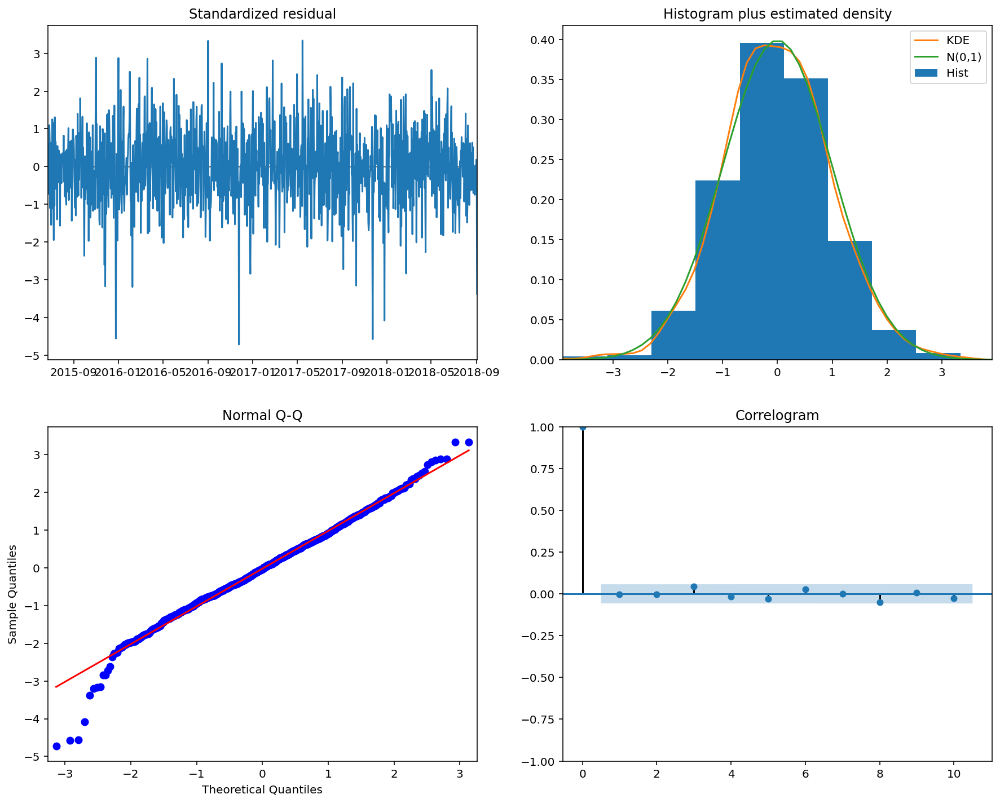

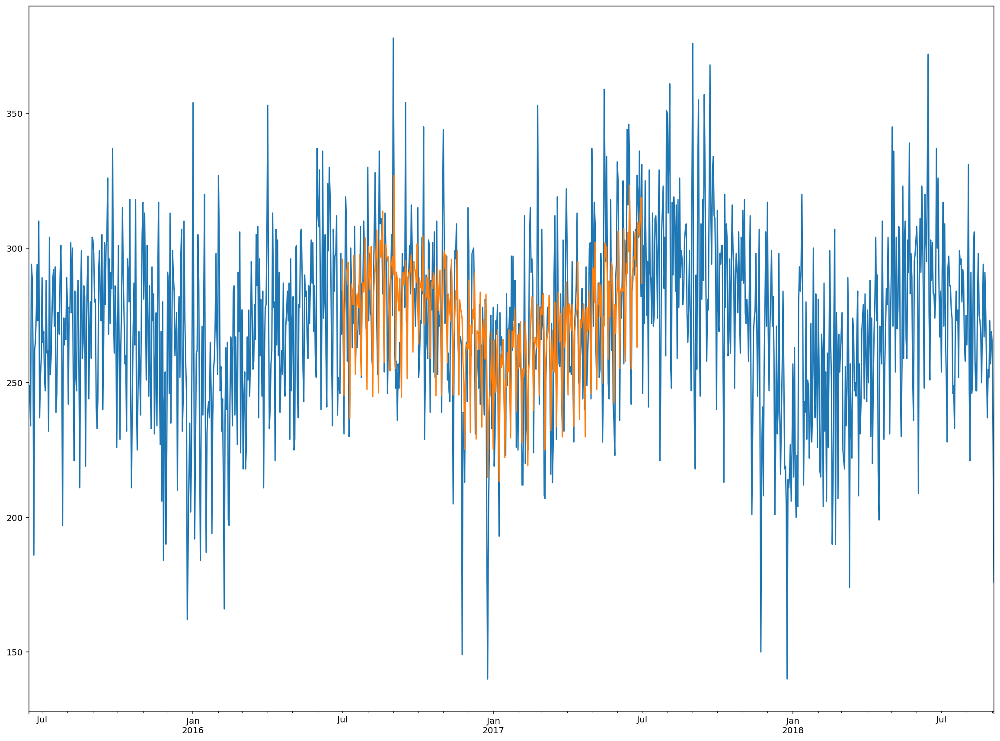

In [ ]:
#The result shows that (1,1,1) (1,1,1,7) is the best combination to minimize AIC.

model=SARIMAX(c['Count'], order=(1,1,1), seasonal_order=(1,1,1, 7)).fit()
summary = model.summary()
print(summary)

model.plot_diagnostics(figsize=(15, 12))
plt.show()


predict_data = model.predict(start='2016-07-01', end='2017-07-01', dynamic = False)
timeseries.index = pd.DatetimeIndex(timeseries.index)
fig, ax = plt.subplots(figsize=(20, 15))
ax = timeseries.plot(ax=ax)
predict_data.plot(ax=ax)
plt.show()

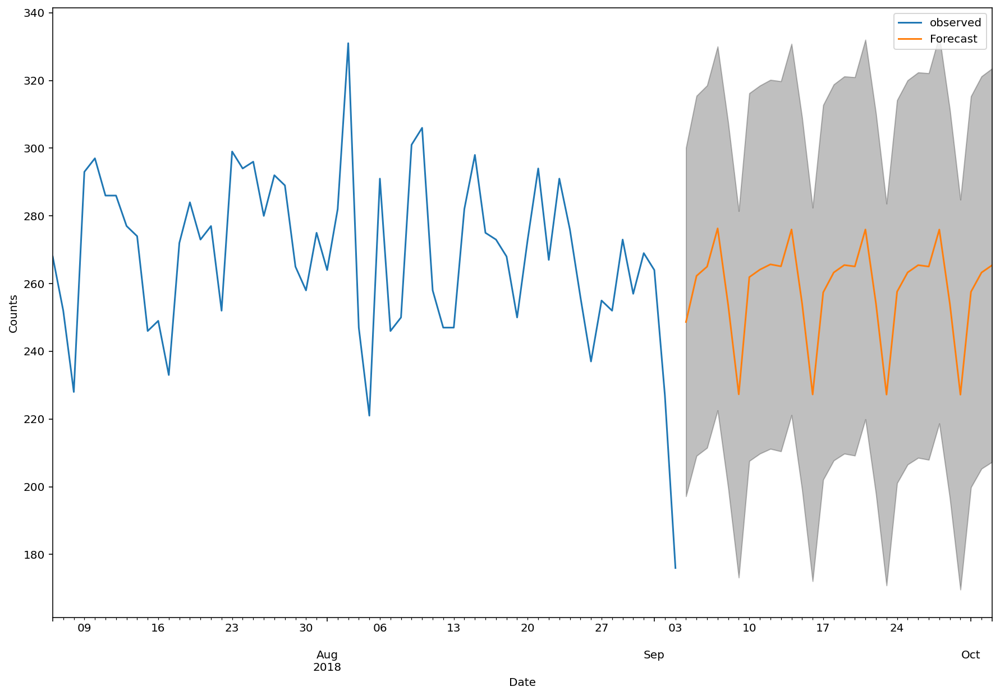

In [ ]:
# new prediction is much better. But it's not doing well when there are extreme numbers.
# forecasting the data for next 30 days

pred_uc = model.get_forecast(steps=30)

pred_ci = pred_uc.conf_int() # confidence intervals of forecasts


ax = c['Count'][-60:].plot(label='observed', figsize=(15, 10))
pred_uc.predicted_mean.plot(ax=ax, label='Forecast')
ax.fill_between(pred_ci.index,
                pred_ci.iloc[:, 0],
                pred_ci.iloc[:, 1], color='k', alpha=.25)
ax.set_xlabel('Date')
ax.set_ylabel('Counts')

plt.legend()
plt.show()

In [ ]:
ytrue=timeseries["2016-07-01":"2017-07-01"]
ytrue

2016-07-01    284
2016-07-02    268
2016-07-03    231
2016-07-04    284
2016-07-05    319
             ... 
2017-06-27    304
2017-06-28    336
2017-06-29    311
2017-06-30    282
2017-07-01    331
Name: Count, Length: 366, dtype: int64

In [ ]:
ypred=predict_data
ypred

2016-07-01    295.887295
2016-07-02    274.074372
2016-07-03    245.354153
2016-07-04    275.894286
2016-07-05    286.433176
                 ...    
2017-06-27    307.660188
2017-06-28    304.555924
2017-06-29    313.088573
2017-06-30    318.762826
2017-07-01    286.872094
Freq: D, Length: 366, dtype: float64

In [ ]:
def forecast_accuracy(forecast, actual):
    mape = np.mean(np.abs(forecast - actual)/np.abs(actual))  # MAPE
    me = np.mean(forecast - actual)             # ME
    mae = np.mean(np.abs(forecast - actual))    # MAE
    mpe = np.mean((forecast - actual)/actual)   # MPE
    rmse = np.mean((forecast - actual)**2)**.5  # RMSE
    corr = np.corrcoef(forecast, actual)[0,1]   # corr
    mins = np.amin(np.hstack([forecast[:,None],
                              actual[:,None]]), axis=1)
    maxs = np.amax(np.hstack([forecast[:,None],
                              actual[:,None]]), axis=1)
    minmax = 1 - np.mean(mins/maxs)             # minmax

    return({'mape':mape, 'me':me, 'mae': mae,
            'mpe': mpe, 'rmse':rmse,
            'corr':corr, 'minmax':minmax})



In [ ]:
forecast_accuracy(ypred,ytrue)

{'corr': 0.5635578776699173,
 'mae': 20.300690784071378,
 'mape': 0.07589148823691975,
 'me': -0.4325637025904605,
 'minmax': 0.07029316786085738,
 'mpe': 0.007959915990053865,
 'rmse': 26.39846854555305}

##Exponential Smoothing##

In [ ]:
import numpy as np
import pandas as pd
from sklearn import preprocessing
from sklearn.neighbors import KNeighborsClassifier
import os
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))
from sklearn.preprocessing import LabelEncoder, OneHotEncoder

In [ ]:
from matplotlib import rc
from pylab import rcParams
from pandas.plotting import register_matplotlib_converters
import seaborn as sns



register_matplotlib_converters()
# sns.set(style='whitegrid', palette='muted', font_scale=1.5)

rcParams['figure.figsize'] = 22, 10

*Reading the data*


In [ ]:
crime = pd.read_csv('https://raw.githubusercontent.com/sahithyasenthil/mldmlab/master/crime.csv',parse_dates=True,encoding='latin-1')

In [ ]:
crime1=crime.copy()

In [ ]:
crime.head()

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location
0,I182070945,619,Larceny,LARCENY ALL OTHERS,D14,808,NaN,2018-09-02 13:00:00,2018,9,Sunday,13,Part One,LINCOLN ST,42.357791,-71.139371,"(42.35779134, -71.13937053)"
1,I182070943,1402,Vandalism,VANDALISM,C11,347,NaN,2018-08-21 00:00:00,2018,8,Tuesday,0,Part Two,HECLA ST,42.306821,-71.060300,"(42.30682138, -71.06030035)"
2,I182070941,3410,Towed,TOWED MOTOR VEHICLE,D4,151,NaN,2018-09-03 19:27:00,2018,9,Monday,19,Part Three,CAZENOVE ST,42.346589,-71.072429,"(42.34658879, -71.07242943)"
3,I182070940,3114,Investigate Property,INVESTIGATE PROPERTY,D4,272,NaN,2018-09-03 21:16:00,2018,9,Monday,21,Part Three,NEWCOMB ST,42.334182,-71.078664,"(42.33418175, -71.07866441)"
4,I182070938,3114,Investigate Property,INVESTIGATE PROPERTY,B3,421,NaN,2018-09-03 21:05:00,2018,9,Monday,21,Part Three,DELHI ST,42.275365,-71.090361,"(42.27536542, -71.09036101)"


In [ ]:
crime.shape

(319073, 17)

 *PREPROCESSING*


In [ ]:
crime.drop(['DISTRICT','OFFENSE_DESCRIPTION','REPORTING_AREA','INCIDENT_NUMBER','OFFENSE_CODE','SHOOTING','YEAR','MONTH','DAY_OF_WEEK','HOUR','UCR_PART','Lat','Long','Location','STREET'], axis = 1, inplace = True)


In [ ]:
crime

,OFFENSE_CODE_GROUP,OCCURRED_ON_DATE
0,Larceny,2018-09-02 13:00:00
1,Vandalism,2018-08-21 00:00:00
2,Towed,2018-09-03 19:27:00
3,Investigate Property,2018-09-03 21:16:00
4,Investigate Property,2018-09-03 21:05:00
...,...,...
319068,Warrant Arrests,2016-06-05 17:25:00
319069,Homicide,2015-07-09 13:38:00
319070,Warrant Arrests,2015-07-09 13:38:00
319071,Warrant Arrests,2016-05-31 19:35:00


In [ ]:
crime['DATE'] = pd.to_datetime(crime['OCCURRED_ON_DATE']).dt.date

In [ ]:
crime.drop('OCCURRED_ON_DATE',axis=1,inplace=True)

In [ ]:
crime

,OFFENSE_CODE_GROUP,DATE
0,Larceny,2018-09-02
1,Vandalism,2018-08-21
2,Towed,2018-09-03
3,Investigate Property,2018-09-03
4,Investigate Property,2018-09-03
...,...,...
319068,Warrant Arrests,2016-06-05
319069,Homicide,2015-07-09
319070,Warrant Arrests,2015-07-09
319071,Warrant Arrests,2016-05-31


In [ ]:
dataset = pd.pivot_table(crime, index=['DATE'], aggfunc='count')

In [ ]:
idx = pd.date_range('2015-06-15', '2018-09-03')

dataset = dataset.reindex(idx, fill_value = 0)

In [ ]:
dataset['OFFENSE_CODE_GROUP'].sum()

319073

*Stationary Test*

In [ ]:
from statsmodels.tsa.stattools import adfuller
def test_stationarity(series,mlag = 50, lag = None,):
    print('ADF Test Result')
    res = adfuller(series, maxlag = mlag, autolag = lag)
    output = pd.Series(res[0:4],index = ['Test Statistic', 'p value', 'used lag', 'Number of observations used'])
    for key, value in res[4].items():
        output['Critical Value ' + key] = value
    print(output)

In [ ]:
test_stationarity(dataset['OFFENSE_CODE_GROUP'],lag='AIC')

ADF Test Result
Test Statistic                   -2.038102
p value                           0.270120
used lag                         41.000000
Number of observations used    1135.000000
Critical Value 1%                -3.436125
Critical Value 5%                -2.864090
Critical Value 10%               -2.568128
dtype: float64


Thus the null hypothesis( The given dataset is not stationary) cannot be rejected

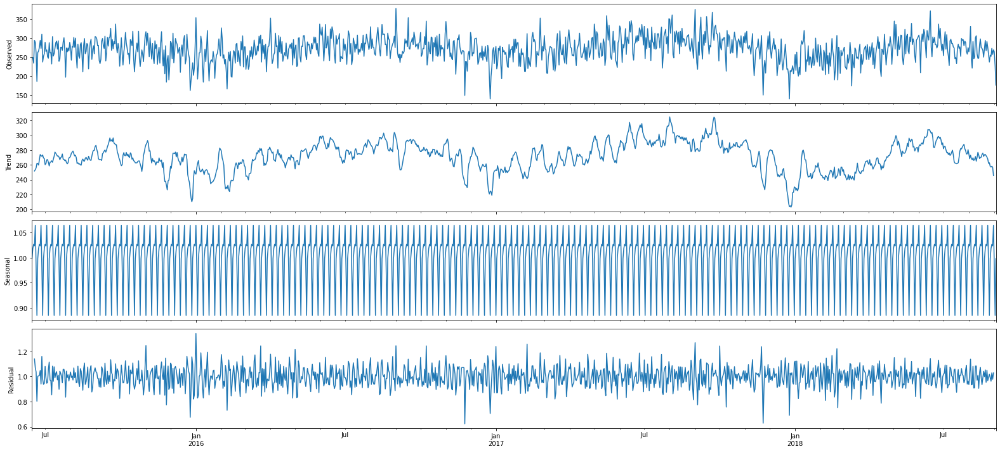

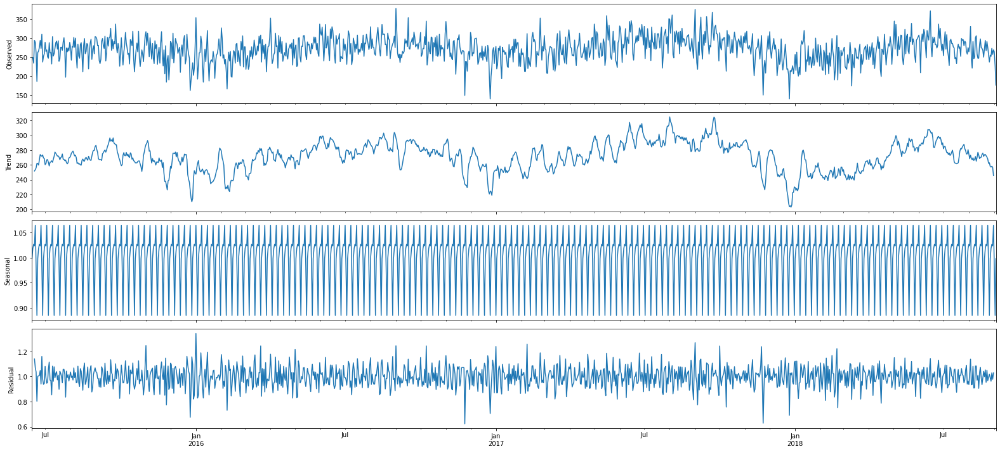

In [ ]:
import statsmodels.api as sm
decomposition = sm.tsa.seasonal_decompose(dataset['OFFENSE_CODE_GROUP'], model='multiplicative')
decomposition.plot()


Exponential Smoothing is used for datasets which are not stationery. The below plots will indicate that the dataset is not stationery.

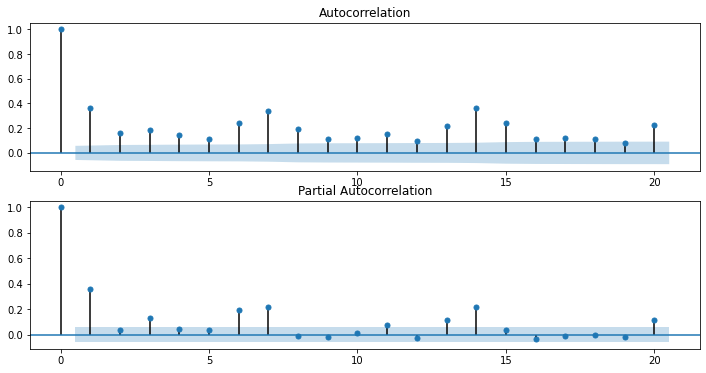

In [ ]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

fig, ax = plt.subplots(2, figsize=(12,6))
ax[0] = plot_acf(dataset, ax=ax[0], lags=20)
ax[1] = plot_pacf(dataset, ax=ax[1], lags=20)

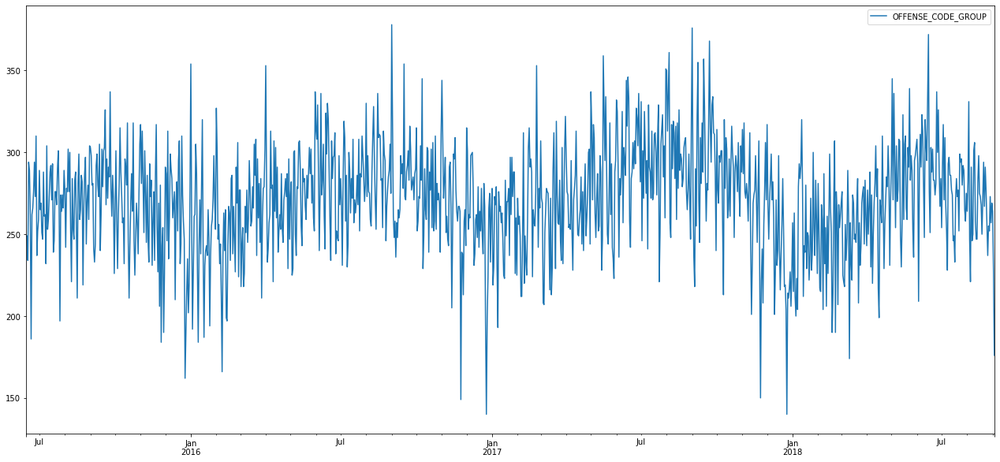

In [ ]:
dataset.plot()

TRAINING AND TESTING SPLIT 70:30

In [ ]:
train=dataset.iloc[:824]
test=dataset.iloc[824:]

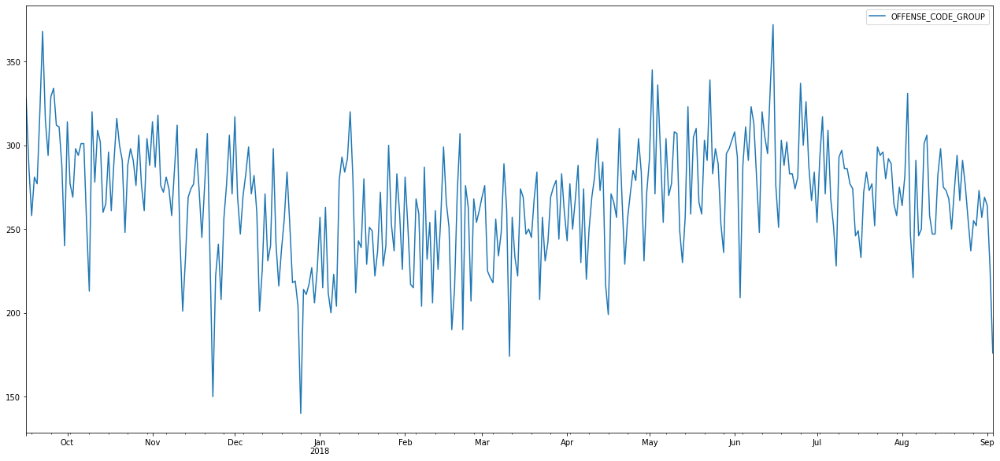

In [ ]:
test.plot()

In [ ]:
from statsmodels.tsa.holtwinters import ExponentialSmoothing

In [ ]:
model=ExponentialSmoothing(train['OFFENSE_CODE_GROUP'],trend='mul',seasonal='add',damped=True,seasonal_periods=365).fit(optimized=True, use_boxcox=True, remove_bias=True)

/usr/local/lib/python3.6/dist-packages/statsmodels/tsa/holtwinters.py:712: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning)


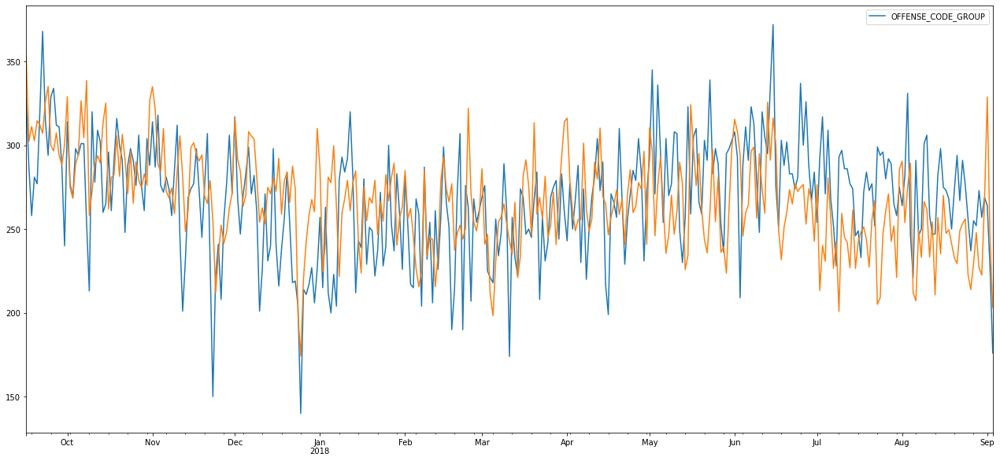

In [ ]:
test.plot()
model.forecast(353).plot()

In [ ]:
prediction=model.forecast(353)

In [ ]:
from sklearn.metrics import mean_squared_error
error = mean_squared_error(test, prediction)
print(' Test MSE : %3f' %error)

 Test MSE : 1365.570471


## Prophet Algorithm

Prophet is a procedure for forecasting time series data based on an additive model where non-linear trends are fit with yearly, weekly, and daily seasonality, plus holiday effects. It works best with time series that have strong seasonal effects and several seasons of historical data.

In [ ]:
import numpy as np
import pandas as pd
from sklearn import preprocessing
from sklearn.neighbors import KNeighborsClassifier
import os
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

In [ ]:
df = pd.read_csv('https://raw.githubusercontent.com/sahithyasenthil/mldmlab/master/crime.csv', encoding='latin-1')

In [ ]:
df.head()

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location
0,I182070945,619,Larceny,LARCENY ALL OTHERS,D14,808,NaN,2018-09-02 13:00:00,2018,9,Sunday,13,Part One,LINCOLN ST,42.357791,-71.139371,"(42.35779134, -71.13937053)"
1,I182070943,1402,Vandalism,VANDALISM,C11,347,NaN,2018-08-21 00:00:00,2018,8,Tuesday,0,Part Two,HECLA ST,42.306821,-71.060300,"(42.30682138, -71.06030035)"
2,I182070941,3410,Towed,TOWED MOTOR VEHICLE,D4,151,NaN,2018-09-03 19:27:00,2018,9,Monday,19,Part Three,CAZENOVE ST,42.346589,-71.072429,"(42.34658879, -71.07242943)"
3,I182070940,3114,Investigate Property,INVESTIGATE PROPERTY,D4,272,NaN,2018-09-03 21:16:00,2018,9,Monday,21,Part Three,NEWCOMB ST,42.334182,-71.078664,"(42.33418175, -71.07866441)"
4,I182070938,3114,Investigate Property,INVESTIGATE PROPERTY,B3,421,NaN,2018-09-03 21:05:00,2018,9,Monday,21,Part Three,DELHI ST,42.275365,-71.090361,"(42.27536542, -71.09036101)"


In [ ]:
df = df[['OFFENSE_CODE_GROUP','OCCURRED_ON_DATE','YEAR','MONTH','DAY_OF_WEEK','Lat','Long']]

In [ ]:
df = df.dropna()

In [ ]:
df.reset_index(inplace=True)

In [ ]:
# Filtering the locations to get all coordinates in the Boston area

lis = []

Lat = list(df['Lat'])
Long = list(df['Long'])

for i in range(len(Lat)):
    li = []
    if Lat[i] > 30 and Long[i] < -40:
        li.append(Lat[i])
        li.append(Long[i])
    else:
        li.append(np.nan)
        li.append(np.nan)
    lis.append(li)

del Lat
del Long

L = np.array(lis)
Latitude = L[:, 0]
Longitude = L[:, 1]

df['Latitude'] = Latitude
df['Longitude'] = Longitude

df = df.dropna()
df.reset_index(inplace = True)
df.head()

,level_0,index,OFFENSE_CODE_GROUP,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,Lat,Long,Latitude,Longitude
0,0,0,Larceny,2018-09-02 13:00:00,2018,9,Sunday,42.357791,-71.139371,42.357791,-71.139371
1,1,1,Vandalism,2018-08-21 00:00:00,2018,8,Tuesday,42.306821,-71.060300,42.306821,-71.060300
2,2,2,Towed,2018-09-03 19:27:00,2018,9,Monday,42.346589,-71.072429,42.346589,-71.072429
3,3,3,Investigate Property,2018-09-03 21:16:00,2018,9,Monday,42.334182,-71.078664,42.334182,-71.078664
4,4,4,Investigate Property,2018-09-03 21:05:00,2018,9,Monday,42.275365,-71.090361,42.275365,-71.090361


In [ ]:
lis

[[42.35779134, -71.13937053],
 [42.30682138, -71.06030035],
 [42.34658879, -71.07242943],
 [42.33418175, -71.07866441],
 [42.27536542, -71.09036101],
 [42.29019621, -71.07159012],
 [42.30607218, -71.0827326],
 [42.32701648, -71.10555088],
 [42.33152148, -71.07085307],
 [42.29514664, -71.05860832],
 [42.31957856, -71.04032766],
 [42.34011469, -71.05339029],
 [42.3503876, -71.0878529],
 [42.28647012, -71.08714661],
 [42.27924052, -71.09667382],
 [42.35287456, -71.0738297],
 [42.30526428, -71.06683755],
 [42.34857652, -71.07772012],
 [42.33371742, -71.09665806],
 [42.3256949, -71.06816778],
 [nan, nan],
 [42.35564426, -71.07168077],
 [42.28340243, -71.0807974],
 [42.27581799, -71.13991259],
 [42.33506218, -71.09316781],
 [42.28359328, -71.05565683],
 [42.33311189, -71.0727637],
 [42.31731905, -71.06150882],
 [42.31731905, -71.06150882],
 [42.29590385, -71.08773294],
 [42.28013735, -71.09079826],
 [42.28810362, -71.09153335],
 [42.29928376, -71.059172],
 [42.30524752, -71.08089418],
 [42.3

In [ ]:
df = df[['OFFENSE_CODE_GROUP','OCCURRED_ON_DATE','YEAR','MONTH','DAY_OF_WEEK','Latitude','Longitude']]

Latitude = list(df['Latitude'])
Longitude = list(df['Longitude'])

L = [[Latitude[i], Longitude[i]] for i in range(len(Latitude))]

X = np.array(L)
X.shape

(298329, 2)

In [ ]:
from sklearn.cluster import DBSCAN

import matplotlib.pyplot as plt

# Choose a small value for eps, because greater the eps, more the neighboring points and hence, more storage is required.

# Sample Values:
# 1) eps = 0.001454, min_samples = 40 => 67 clusters
# 2) eps = 0.00365, min_samples = 4 => 11 clusters

epsilon = 0.00365
min_sample_points = 4

dbscan_clustering = DBSCAN(eps = epsilon, min_samples = min_sample_points).fit(X)

Clusters = dbscan_clustering.labels_.tolist()

print("Clusters: " + str(list(set(Clusters))))

Clusters: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, -1]


In [ ]:
X

array([[ 42.35779134, -71.13937053],
       [ 42.30682138, -71.06030035],
       [ 42.34658879, -71.07242943],
       ...,
       [ 42.25592648, -71.12317207],
       [ 42.30233307, -71.11156487],
       [ 42.33383935, -71.08029038]])

Text(0, 0.5, 'Longitude')

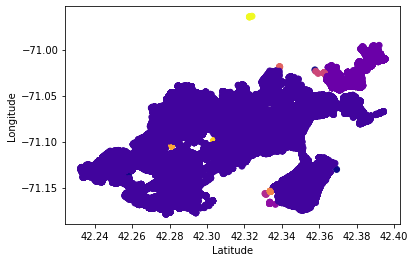

In [ ]:
# Plot the cluster assignments

plt.scatter(X[:, 0], X[:, 1], c = Clusters, cmap = "plasma")
plt.xlabel("Latitude")
plt.ylabel("Longitude")

# For a specific cluster, use X_ (from the above cell) instead of X

In [ ]:
df['Cluster'] = Clusters
df.head()

,OFFENSE_CODE_GROUP,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,Latitude,Longitude,Cluster
0,Larceny,2018-09-02 13:00:00,2018,9,Sunday,42.357791,-71.139371,0
1,Vandalism,2018-08-21 00:00:00,2018,8,Tuesday,42.306821,-71.060300,0
2,Towed,2018-09-03 19:27:00,2018,9,Monday,42.346589,-71.072429,0
3,Investigate Property,2018-09-03 21:16:00,2018,9,Monday,42.334182,-71.078664,0
4,Investigate Property,2018-09-03 21:05:00,2018,9,Monday,42.275365,-71.090361,0


In [ ]:
df['OCCURRED_ON_DATE'] = pd.to_datetime(df.OCCURRED_ON_DATE)

In [ ]:
df

,OFFENSE_CODE_GROUP,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,Latitude,Longitude,Cluster
0,Larceny,2018-09-02 13:00:00,2018,9,Sunday,42.357791,-71.139371,0
1,Vandalism,2018-08-21 00:00:00,2018,8,Tuesday,42.306821,-71.060300,0
2,Towed,2018-09-03 19:27:00,2018,9,Monday,42.346589,-71.072429,0
3,Investigate Property,2018-09-03 21:16:00,2018,9,Monday,42.334182,-71.078664,0
4,Investigate Property,2018-09-03 21:05:00,2018,9,Monday,42.275365,-71.090361,0
...,...,...,...,...,...,...,...,...
298324,Warrant Arrests,2016-06-05 17:25:00,2016,6,Sunday,42.336951,-71.085748,0
298325,Homicide,2015-07-09 13:38:00,2015,7,Thursday,42.255926,-71.123172,0
298326,Warrant Arrests,2015-07-09 13:38:00,2015,7,Thursday,42.255926,-71.123172,0
298327,Warrant Arrests,2016-05-31 19:35:00,2016,5,Tuesday,42.302333,-71.111565,0


In [ ]:
df = df.sort_values(by='OCCURRED_ON_DATE')
df.reset_index(inplace = True)

In [ ]:
df

,index,OFFENSE_CODE_GROUP,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,Latitude,Longitude,Cluster
0,120132,Harassment,2015-06-15 00:00:00,2015,6,Monday,42.291093,-71.065945,0
1,296780,Search Warrants,2015-06-15 00:00:00,2015,6,Monday,42.377023,-71.032247,1
2,289904,Other,2015-06-15 00:00:00,2015,6,Monday,42.293606,-71.071887,0
3,297704,Property Lost,2015-06-15 00:00:00,2015,6,Monday,42.328663,-71.085634,0
4,296781,Investigate Person,2015-06-15 00:00:00,2015,6,Monday,42.377023,-71.032247,1
...,...,...,...,...,...,...,...,...,...
298324,8,Robbery,2018-09-03 20:48:00,2018,9,Monday,42.331521,-71.070853,0
298325,4,Investigate Property,2018-09-03 21:05:00,2018,9,Monday,42.275365,-71.090361,0
298326,5,Motor Vehicle Accident Response,2018-09-03 21:09:00,2018,9,Monday,42.290196,-71.071590,0
298327,3,Investigate Property,2018-09-03 21:16:00,2018,9,Monday,42.334182,-71.078664,0


In [ ]:
lisp = [i.date() for i in list(df['OCCURRED_ON_DATE'])]

df['OCCURRED_ON_DATE'] = lisp

In [ ]:
df

,index,OFFENSE_CODE_GROUP,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,Latitude,Longitude,Cluster
0,120132,Harassment,2015-06-15,2015,6,Monday,42.291093,-71.065945,0
1,296780,Search Warrants,2015-06-15,2015,6,Monday,42.377023,-71.032247,1
2,289904,Other,2015-06-15,2015,6,Monday,42.293606,-71.071887,0
3,297704,Property Lost,2015-06-15,2015,6,Monday,42.328663,-71.085634,0
4,296781,Investigate Person,2015-06-15,2015,6,Monday,42.377023,-71.032247,1
...,...,...,...,...,...,...,...,...,...
298324,8,Robbery,2018-09-03,2018,9,Monday,42.331521,-71.070853,0
298325,4,Investigate Property,2018-09-03,2018,9,Monday,42.275365,-71.090361,0
298326,5,Motor Vehicle Accident Response,2018-09-03,2018,9,Monday,42.290196,-71.071590,0
298327,3,Investigate Property,2018-09-03,2018,9,Monday,42.334182,-71.078664,0


In [ ]:
def initialize_frames(df, Clusters):
    frame_cache = {}

    for i in range(len(Clusters)):
        df_x = df[df['Cluster'] == Clusters[i]]
        frame_cache['df' + str(i)] = df_x

    return frame_cache

In [ ]:
set_of_clusters = list(set(Clusters))

In [ ]:
set_of_clusters

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, -1]

In [ ]:
frame_cache = initialize_frames(df, set_of_clusters)

In [ ]:
frame_cache

{'df0':          index               OFFENSE_CODE_GROUP  ...  Longitude  Cluster
 0       120132                       Harassment  ... -71.065945        0
 2       289904                            Other  ... -71.071887        0
 3       297704                    Property Lost  ... -71.085634        0
 5       282857                            Fraud  ... -71.056208        0
 6       294085                 Confidence Games  ... -71.080979        0
 ...        ...                              ...  ...        ...      ...
 298324       8                          Robbery  ... -71.070853        0
 298325       4             Investigate Property  ... -71.090361        0
 298326       5  Motor Vehicle Accident Response  ... -71.071590        0
 298327       3             Investigate Property  ... -71.078664        0
 298328       6                       Auto Theft  ... -71.082733        0
 
 [285294 rows x 9 columns],
 'df1':          index               OFFENSE_CODE_GROUP  ...  Longitude  Cl

To use Prophet for forecasting, first, a Prophet() object is defined and configured, then it is fit on the dataset by calling the fit() function and passing the data.

The Prophet() object takes arguments to configure the type of model you want, such as the type of growth, the type of seasonality, and more. By default, the model will work hard to figure out almost everything automatically.

The fit() function takes a DataFrame of time series data. The DataFrame must have a specific format. The first column must have the name ‘ds‘ and contain the date-times. The second column must have the name ‘y‘ and contain the observations.

This means we change the column names in the dataset. It also requires that the first column be converted to date-time objects, if they are not already (e.g. this can be down as part of loading the dataset with the right arguments to read_csv).

In [ ]:
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from math import sqrt
def get_metrics(y_actual, y_predicted, algorithm = '', model_number = '', save_to_file = False):
    if save_to_file:
        if algorithm == '' or algorithm is None:
            print("Please enter algorithm name for the metrics file")
            return

        f = open('DBSCAN_' + algorithm + '_metrics.txt', "a+")

        if model_number == '' or model_number is None:
            print("Please enter model number")
            return

        f.write("\n\n***************** Model " + model_number + " *******************\n\n")
        f.write("Root mean squared error (RMSE) => " + str(sqrt(mean_squared_error(y_actual, y_predicted))) + "\n")
        f.write("Mean squared error (MSE) => " + str(mean_squared_error(y_actual, y_predicted)) + "\n")
        f.write("Mean abolute error (MAE) => " + str(mean_absolute_error(y_actual, y_predicted)) + "\n")
    else:
        print("***************** Prediction Metrics *******************\n\n")
        print("Root mean squared error (RMSE) => " , sqrt(mean_squared_error(y_actual, y_predicted)))
        print("Mean squared error (MSE) => " , mean_squared_error(y_actual, y_predicted))
        print("Mean absolute error (MAE) => ", mean_absolute_error(y_actual, y_predicted))

    print("Model_" + model_number + "'s metrics have been recorded")

In [ ]:
import pickle

def save_model(model, model_number, model_type, last_date):

    pkl_path = ''
    if model_type == 'Prophet':
        pkl_path = 'DBSCAN_' + model_type + '_' + model_number + '.pkl'
    elif model_type == 'ETS' or model_type == 'ARIMA':
        if last_date is None or last_date == '':
            print("Please enter the last training date for the model")
            return
        if model_number is None or model_number == '':
            print("Please enter the model number")
            return
        pkl_path = 'DBSCAN_' + model_type + '_' + model_number + '_' + last_date + '.pkl'
    else:
        print("Please enter the correct model type: (Prophet, ETS or ARIMA)")
        return

    with open(pkl_path, 'wb') as f:
        pickle.dump(model, f)

def load_model(pkl_path):
    model = None
    try:
        with open(pkl_path, 'rb') as f:
            model = pickle.load(f)
    except pickle.UnpicklingError:
        with open(pkl_path, 'rb') as f:
            model = f.read()
    return model

In [ ]:
from matplotlib import pyplot
def ProphetsForecast(model, no_of_days):
    future = model.make_future_dataframe(periods = no_of_days)
    forecast = model.predict(future)
    model.plot(forecast)
    pyplot.show()
    return forecast

def TestProphet(model, df_train, df_test):
    actual_dates = list(df_test['ds'])
    LatestDate = actual_dates[-1]
    LastDate = list(df_train['ds'])[-1]

    no_of_days = (LatestDate - LastDate).days
    if no_of_days <= 0:
        print("Please enter a date after " + str(LastDate))
        return

    forecast = ProphetsForecast(model, no_of_days)
    yhat = list(forecast['yhat'])

    predictions = list()
    for DATE in actual_dates:
        diff = (DATE - LastDate).days
        predictions.append(yhat[diff - 1])

    return predictions
# Creating Prophet models

In [ ]:
import datetime
from fbprophet import Prophet

def createProphet(x, df_x, save_metrics = False, save_Model = False):

    df_x.reset_index(inplace = True)
    df_x = df_x.groupby(['OCCURRED_ON_DATE']).count()[['level_0','index']]
    df_x.drop(columns = ['index'], inplace = True)

    df_train = df_x[0 : int(len(df_x) * 0.8)]
    df_train = df_train.reset_index()
    df_train.rename(columns = {'OCCURRED_ON_DATE':'ds', 'level_0':'y'} , inplace = True)

    df_test = df_x[int(len(df_x) * 0.8) : ]
    df_test = df_test.reset_index()
    df_test.rename(columns = {'OCCURRED_ON_DATE':'ds', 'level_0':'y'} , inplace = True)
    print(df_x)

    # Prophet models cannot make predictions using just 1 training sample

    while len(df_train) < 2:
        train_date = list(df_train['ds'])
        train_y = list(df_train['y'])

        test_date = list(df_test['ds'])
        test_y = list(df_test['y'])

        train_date.append(test_date[0])
        train_y.append(test_y[0])

        test_date.remove(test_date[0])
        test_y.remove(test_y[0])

        if len(test_date) > 0:
            Next_Date = test_date[-1] + datetime.timedelta(days = 1)
            if len(test_y) == 0:
                Next_Y = 0
            else:
                Next_Y = sum(test_y) // len(test_y)
            test_date.append(Next_Date)
            test_y.append(Next_Y)
        else:
            Next_Date = train_date[-1] + datetime.timedelta(days = 1)
            if len(train_y) == 0:
                Next_Y = 0
            else:
                Next_Y = sum(train_y) // len(train_y)
            test_date.append(Next_Date)
            test_y.append(Next_Y)

        df_train = pd.DataFrame()
        df_test = pd.DataFrame()

        df_train['ds'] = train_date
        df_test['ds'] = test_date

        df_train['y'] = train_y
        df_test['y'] = test_y

    prophet = Prophet()
    prophet.fit(df_train)


    predicted = TestProphet(prophet, df_train, df_test)
    print("Predicted",predicted)

    get_metrics(df_test['y'], predicted, 'Prophet', str(x), save_metrics)

    if save_Model:
        save_model(prophet, str(x), 'Prophet', last_date = '')

                  level_0
OCCURRED_ON_DATE         
2015-06-15            229
2015-06-16            229
2015-06-17            211
2015-06-18            277
2015-06-19            270
...                   ...
2018-08-30            235
2018-08-31            254
2018-09-01            255
2018-09-02            214
2018-09-03            170

[1177 rows x 1 columns]


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


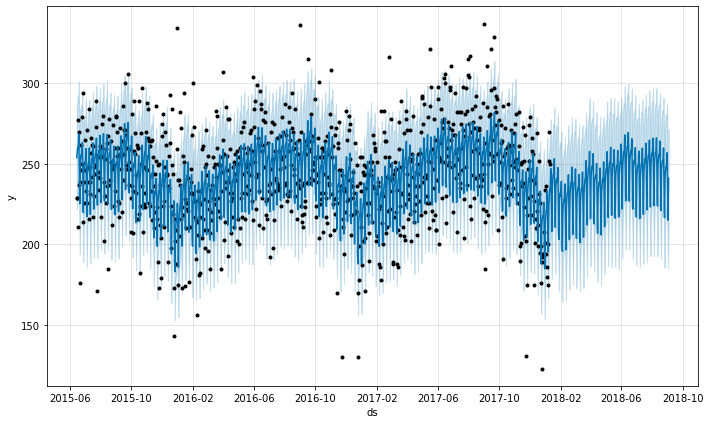

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Predicted [253.82410437882885, 258.26513397015503, 260.49504366778604, 259.0443610439068, 268.51686289528953, 247.17139502393564, 225.2154439568846, 250.25393803886774, 254.1161006992794, 255.87004683115416, 254.05524430916475, 263.2813446742061, 241.8099144398734, 219.84801215845425, 244.99708656582342, 249.0800137137065, 251.15595654654615, 249.75315915618484, 259.4681679695627, 238.54799797584562, 217.18417464568228, 242.9621117147766, 247.68862741902825, 250.4072676348864, 249.63153394114718, 259.94449587435236, 239.5812941317932, 218.72345599618595, 244.94847602561651, 250.05745991740676, 253.09049789103005, 252.5598661012862, 263.0495384050864, 242.7975207091466, 221.98993685695012, 248.21032871147017, 253.26697954603307, 256.20793948083343, 255.55386463815788, 265.8971658089362, 245.48399217910406, 224.5079917913869, 250.5593230832299, 255.45173686144057, 258.2374159250459, 257.43969041595835, 267.652128813076, 247.12053182007946, 226.03677004106396, 251.98793654553074, 256.7836

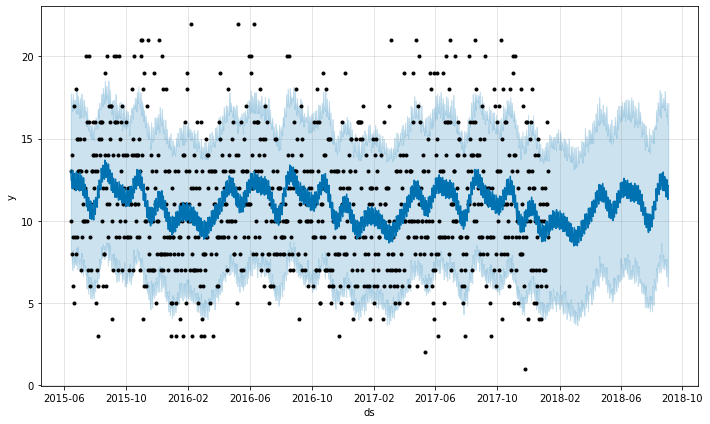

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 7.


Predicted [13.049839565863035, 12.445135329846128, 12.447897382153911, 11.949336866594944, 13.060399246940921, 12.502687187955143, 11.970722283571225, 12.874897052022435, 12.287720242280836, 12.311583273361473, 11.836219526786214, 12.971024217123528, 12.43602870394765, 11.924214608451624, 12.844517593071489, 12.268122295903378, 12.296274743026373, 11.817782558737022, 12.941369437549692, 12.386676657124266, 11.846596120401372, 12.730284146134426, 12.109457116223796, 12.086195187852695, 11.550424548465196, 12.612245105679118, 11.992897078878766, 11.387051909316401, 12.205777852195707, 11.522782687179687, 11.442161230292133, 10.855819705255659, 11.875745506841177, 11.224917477467233, 10.599543734457871, 11.411978952210049, 10.736924952094206, 10.679143533733285, 10.130854654711527, 11.203989307467104, 10.621092773590915, 10.077565578247862, 10.984594050841308, 10.415374062053667, 10.472856310844193, 10.04718544552496, 11.248001304381475, 10.795396681671317, 10.382217491461127, 11.41705564

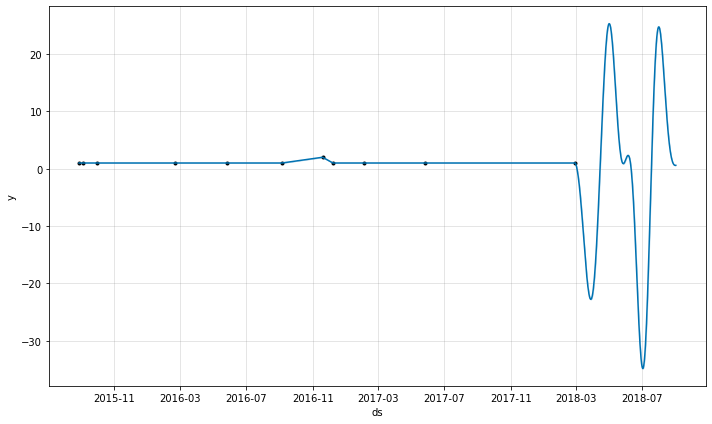

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 0.


Predicted [-21.264822890159653, 2.116084356941572, 3.6218630021421934]
***************** Prediction Metrics *******************


Root mean squared error (RMSE) =>  12.959451483042393
Mean squared error (MSE) =>  167.94738274132968
Mean absolute error (MAE) =>  8.667590083081139
Model_2's metrics have been recorded
                  level_0
OCCURRED_ON_DATE         
2017-01-21              1
2017-08-16              2
2018-08-29              1


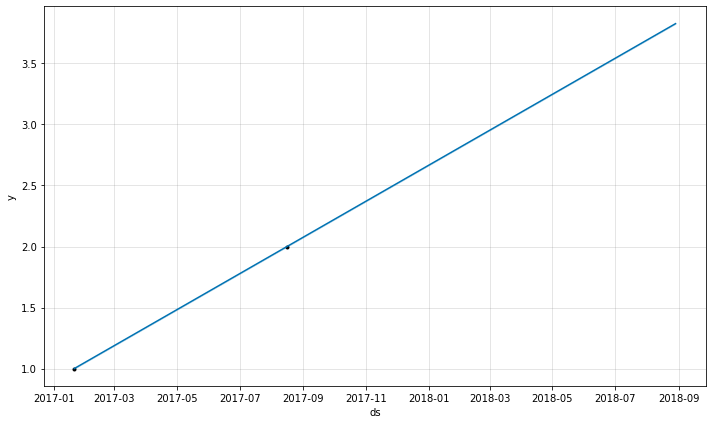

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 15.


Predicted [3.8164251207729465]
***************** Prediction Metrics *******************


Root mean squared error (RMSE) =>  2.8164251207729465
Mean squared error (MSE) =>  7.932250460920907
Mean absolute error (MAE) =>  2.8164251207729465
Model_3's metrics have been recorded
                  level_0
OCCURRED_ON_DATE         
2015-09-20              1
2015-11-11              1
2016-02-18              1
2016-03-23              1
2016-03-25              1
2016-04-21              1
2016-07-05              1
2017-02-05              1
2017-02-21              1
2017-03-13              1
2017-04-20              1
2017-06-01              1
2017-11-04              1
2018-01-07              2
2018-03-03              1
2018-04-06              1
2018-06-05              1
2018-06-08              1
2018-07-04              1
2018-07-10              1
2018-07-20              1
2018-07-27              1
2018-07-28              1
2018-08-16              1
2018-08-18              1


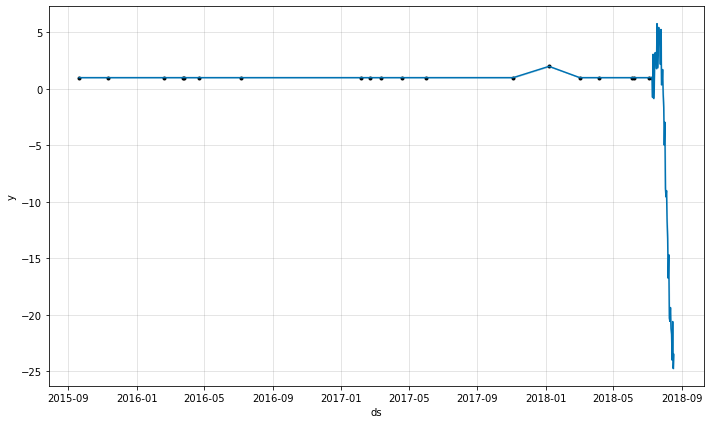

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 2.


Predicted [0.9999999999996779, 1.0000000000001932, 1.0000000000002625, 0.36480629429029954, 1.7213249207963797]
***************** Prediction Metrics *******************


Root mean squared error (RMSE) =>  0.42983268492173204
Mean squared error (MSE) =>  0.18475613702702498
Mean absolute error (MAE) =>  0.2713037253013716
Model_4's metrics have been recorded
                  level_0
OCCURRED_ON_DATE         
2016-09-22              1
2017-07-14              1
2017-09-04              1
2017-12-26              1
2018-08-08              1


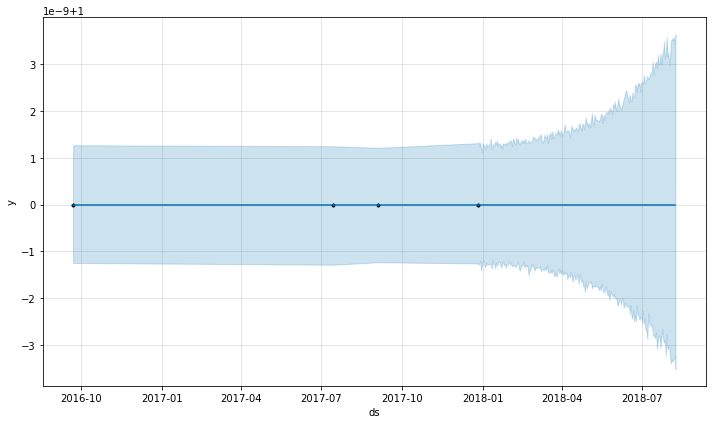

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 18.


Predicted [1.0]
***************** Prediction Metrics *******************


Root mean squared error (RMSE) =>  0.0
Mean squared error (MSE) =>  0.0
Mean absolute error (MAE) =>  0.0
Model_5's metrics have been recorded
                  level_0
OCCURRED_ON_DATE         
2015-06-21              1
2015-07-16              1
2015-08-13              1
2015-08-19              1
2015-09-17              1
2015-09-29              1
2015-10-02              1
2015-10-13              1
2015-10-22              1
2015-10-31              1
2015-11-09              3
2015-11-23              1
2015-12-11              1
2015-12-13              1
2016-01-03              1
2016-01-05              1
2016-01-12              1
2016-01-26              1
2016-05-25              1
2016-10-08              1
2017-01-25              1
2017-04-12              1
2017-05-07              1
2017-05-17              4
2017-05-18              1
2017-05-21              1
2017-09-16              1
2017-11-11              1
20

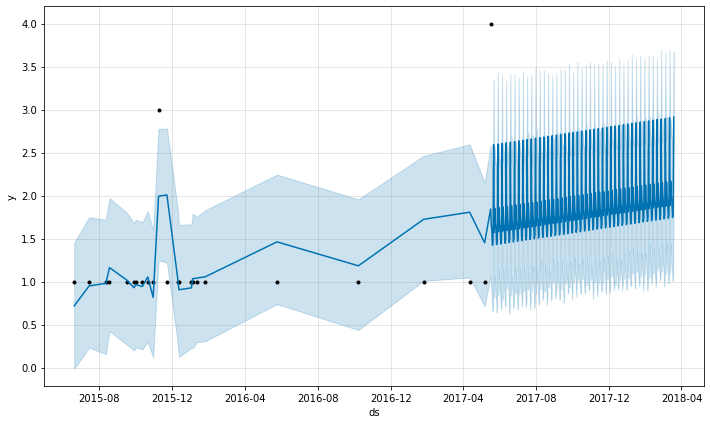

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 4.


Predicted [0.7169544556322197, 1.1622436504912161, 1.9484776315350938, 2.0083811729565455, 1.6679231755140511, 1.8983131942768061]
***************** Prediction Metrics *******************


Root mean squared error (RMSE) =>  0.7389145364663158
Mean squared error (MSE) =>  0.5459946922012303
Mean absolute error (MAE) =>  0.6613973948569155
Model_6's metrics have been recorded
                  level_0
OCCURRED_ON_DATE         
2016-01-01              1
2016-03-06              1
2016-03-28              1
2016-08-20              2
2017-02-12              2
2017-10-13              1
2017-10-22              2
2018-01-06              1
2018-02-10              1


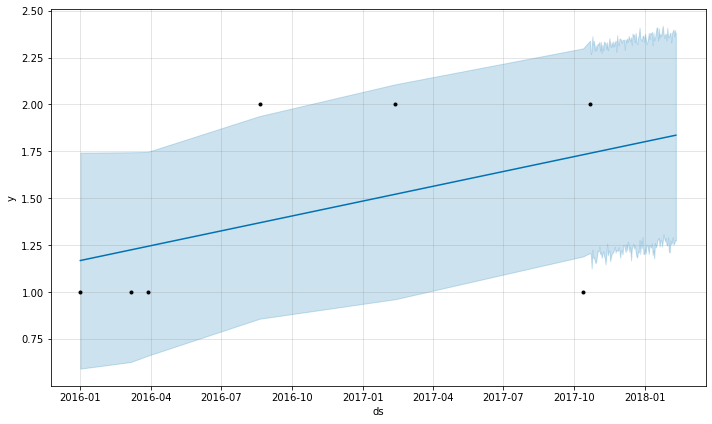

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 0.


Predicted [1.7997880294957154, 1.8301153748066925]
***************** Prediction Metrics *******************


Root mean squared error (RMSE) =>  0.8150927639278535
Mean squared error (MSE) =>  0.6643762138075474
Mean absolute error (MAE) =>  0.8149517021512039
Model_7's metrics have been recorded
                  level_0
OCCURRED_ON_DATE         
2017-06-14              3
2017-07-06              2


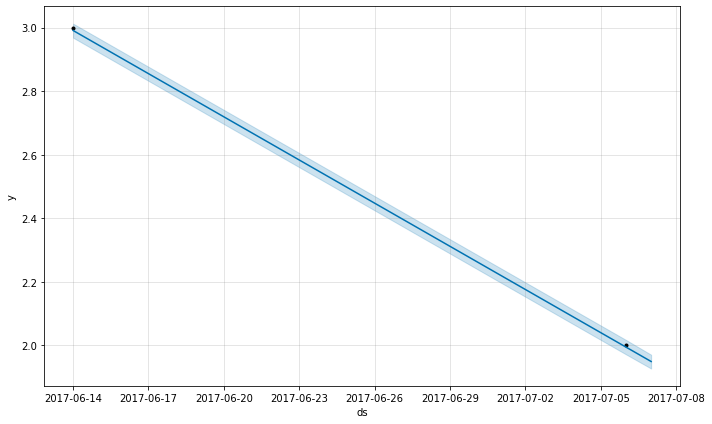

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 1.


Predicted [2.9910249185899307]
***************** Prediction Metrics *******************


Root mean squared error (RMSE) =>  0.9910249185899307
Mean squared error (MSE) =>  0.9821303892661788
Mean absolute error (MAE) =>  0.9910249185899307
Model_8's metrics have been recorded
                  level_0
OCCURRED_ON_DATE         
2015-06-30              1
2015-10-20              1
2016-09-29              1
2017-05-13              1


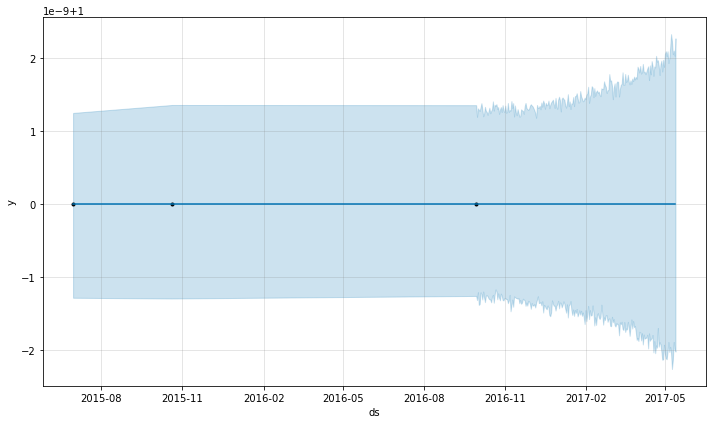

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 0.


Predicted [1.0]
***************** Prediction Metrics *******************


Root mean squared error (RMSE) =>  0.0
Mean squared error (MSE) =>  0.0
Mean absolute error (MAE) =>  0.0
Model_9's metrics have been recorded
                  level_0
OCCURRED_ON_DATE         
2016-09-15              1
2017-07-15              1
2018-08-24              1


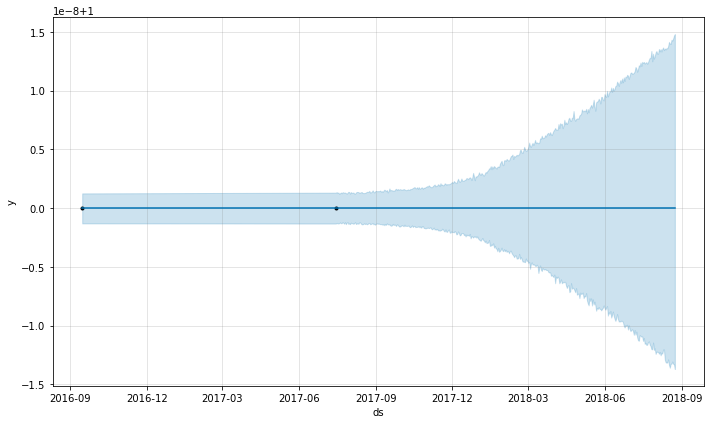

Predicted [1.0]
***************** Prediction Metrics *******************


Root mean squared error (RMSE) =>  0.0
Mean squared error (MSE) =>  0.0
Mean absolute error (MAE) =>  0.0
Model_10's metrics have been recorded


In [ ]:
frame_cache = initialize_frames(df, set_of_clusters)
for i in range(len(set_of_clusters)):
    createProphet(i, frame_cache['df' + str(i)], save_metrics = False, save_Model = False)

# Metrics are stored in DBSCAN_Prophet_metrics.txt

#ENSEMBLE METHOD#

##XGBOOST##

In [ ]:
!pip install xgboost


In [ ]:
import xgboost as xgb


XGBOOST -converting time series to a supervised dataset

/usr/local/lib/python3.6/dist-packages/xgboost/core.py:614: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  "because it will generate extra copies and increase memory consumption")


>expected=328.0, predicted=296.3
>expected=287.0, predicted=249.6
>expected=258.0, predicted=296.8
>expected=281.0, predicted=296.7
>expected=277.0, predicted=282.5
>expected=320.0, predicted=291.0
>expected=368.0, predicted=302.9
>expected=315.0, predicted=303.3
>expected=294.0, predicted=279.5
>expected=329.0, predicted=311.7
>expected=334.0, predicted=305.8
>expected=312.0, predicted=281.4
>expected=311.0, predicted=292.3
>expected=288.0, predicted=307.5
>expected=240.0, predicted=303.0
>expected=314.0, predicted=275.6
>expected=277.0, predicted=285.5
>expected=269.0, predicted=301.7
>expected=298.0, predicted=292.7
>expected=294.0, predicted=291.3
>expected=301.0, predicted=299.8
>expected=301.0, predicted=306.6
>expected=254.0, predicted=277.8
>expected=213.0, predicted=279.9
>expected=320.0, predicted=262.5
>expected=278.0, predicted=279.6
>expected=309.0, predicted=268.6
>expected=302.0, predicted=284.2
>expected=260.0, predicted=264.3
>expected=265.0, predicted=260.5
>expected=

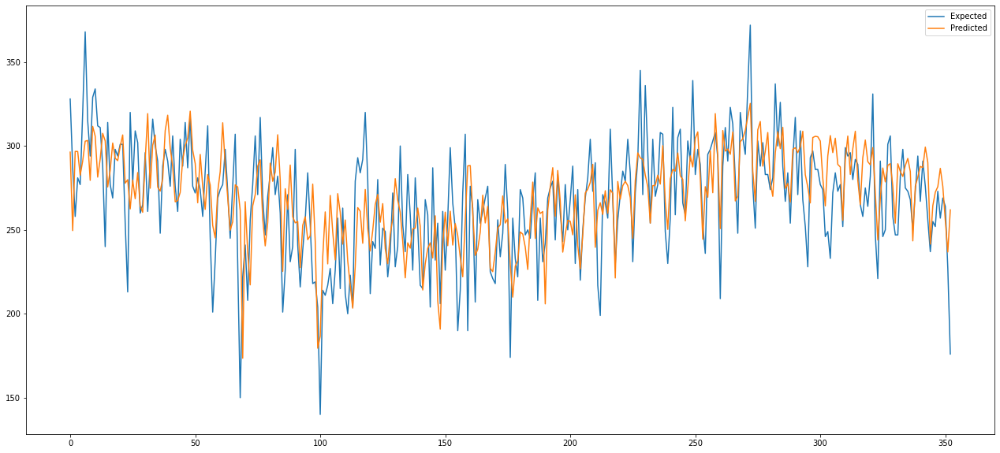

In [ ]:
from numpy import asarray
from pandas import read_csv
from pandas import DataFrame
from pandas import concat
from sklearn.metrics import mean_absolute_error
from xgboost import XGBRegressor
from matplotlib import pyplot

# transform a time series dataset into a supervised learning dataset
def series_to_supervised(data, n_in=100, n_out=100, dropnan=True):
	n_vars = 1 if type(data) is list else data.shape[1]
	df = DataFrame(data)
	cols = list()
	# input sequence (t-n, ... t-1)
	for i in range(n_in, 0, -1):
		cols.append(df.shift(i))
	# forecast sequence (t, t+1, ... t+n)
	for i in range(0, n_out):
		cols.append(df.shift(-i))
	# put it all together
	agg = concat(cols, axis=1)
	# drop rows with NaN values
	if dropnan:
		agg.dropna(inplace=True)
	return agg.values

# split a univariate dataset into train/test sets
def train_test_split(data, n_test):
	return data[:-n_test, :], data[-n_test:, :]

# fit an xgboost model and make a one step prediction
def xgboost_forecast(train, testX):
	# transform list into array
	train = asarray(train)
	# split into input and output columns
	trainX, trainy = train[:, :-1], train[:, -1]
	# fit model
	model = XGBRegressor(objective='reg:squarederror', n_estimators=1000)
	model.fit(trainX, trainy)
	# make a one-step prediction
	yhat = model.predict(asarray([testX]))
	return yhat[0]

# walk-forward validation for univariate data
def walk_forward_validation(data, n_test):
	predictions = list()
	# split dataset
	train, test = train_test_split(data, n_test)
	# seed history with training dataset
	history = [x for x in train]
	# step over each time-step in the test set
	for i in range(len(test)):
		# split test row into input and output columns
		testX, testy = test[i, :-1], test[i, -1]
		# fit model on history and make a prediction
		yhat = xgboost_forecast(history, testX)
		# store forecast in list of predictions
		predictions.append(yhat)
		# add actual observation to history for the next loop
		history.append(test[i])
		# summarize progress
		print('>expected=%.1f, predicted=%.1f' % (testy, yhat))
	# estimate prediction error
	error = mean_absolute_error(test[:, -1], predictions)
	return error, test[:, -1], predictions

# load the dataset
series = dataset
values = series.values
# transform the time series data into supervised learning
data = series_to_supervised(values)
# evaluate
mae, y, yhat = walk_forward_validation(data, 353)
print('MAE: %.3f' % mae)
# plot expected vs preducted
pyplot.plot(y, label='Expected')
pyplot.plot(yhat, label='Predicted')
pyplot.legend()
pyplot.show()

/usr/local/lib/python3.6/dist-packages/xgboost/core.py:614: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  "because it will generate extra copies and increase memory consumption")


>expected=291.0, predicted=283.4
>expected=276.0, predicted=281.8
>expected=256.0, predicted=261.2
>expected=237.0, predicted=239.3
>expected=255.0, predicted=259.1
>expected=252.0, predicted=260.6
>expected=273.0, predicted=268.9
>expected=257.0, predicted=288.1
>expected=269.0, predicted=271.1
>expected=264.0, predicted=248.7
>expected=227.0, predicted=223.4
>expected=176.0, predicted=258.1
MAE: 14.330


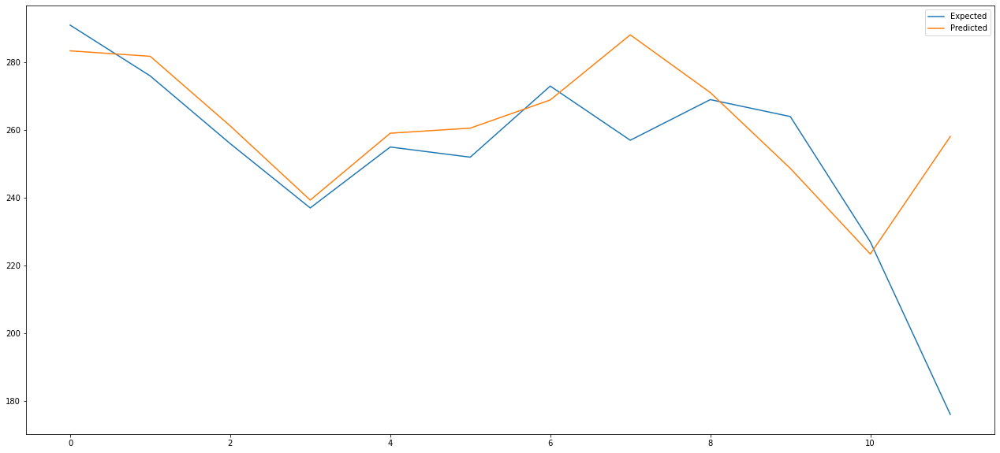

In [ ]:
from numpy import asarray
from pandas import read_csv
from pandas import DataFrame
from pandas import concat
from sklearn.metrics import mean_absolute_error
from xgboost import XGBRegressor
from matplotlib import pyplot

# transform a time series dataset into a supervised learning dataset
def series_to_supervised(data, n_in=100, n_out=100, dropnan=True):
	n_vars = 1 if type(data) is list else data.shape[1]
	df = DataFrame(data)
	cols = list()
	# input sequence (t-n, ... t-1)
	for i in range(n_in, 0, -1):
		cols.append(df.shift(i))
	# forecast sequence (t, t+1, ... t+n)
	for i in range(0, n_out):
		cols.append(df.shift(-i))
	# put it all together
	agg = concat(cols, axis=1)
	# drop rows with NaN values
	if dropnan:
		agg.dropna(inplace=True)
	return agg.values

# split a univariate dataset into train/test sets
def train_test_split(data, n_test):
	return data[:-n_test, :], data[-n_test:, :]

# fit an xgboost model and make a one step prediction
def xgboost_forecast(train, testX):
	# transform list into array
	train = asarray(train)
	# split into input and output columns
	trainX, trainy = train[:, :-1], train[:, -1]
	# fit model
	model = XGBRegressor(objective='reg:squarederror', n_estimators=1000)
	model.fit(trainX, trainy)
	# make a one-step prediction
	yhat = model.predict(asarray([testX]))
	return yhat[0]

# walk-forward validation for univariate data
def walk_forward_validation(data, n_test):
	predictions = list()
	# split dataset
	train, test = train_test_split(data, n_test)
	# seed history with training dataset
	history = [x for x in train]
	# step over each time-step in the test set
	for i in range(len(test)):
		# split test row into input and output columns
		testX, testy = test[i, :-1], test[i, -1]
		# fit model on history and make a prediction
		yhat = xgboost_forecast(history, testX)
		# store forecast in list of predictions
		predictions.append(yhat)
		# add actual observation to history for the next loop
		history.append(test[i])
		# summarize progress
		print('>expected=%.1f, predicted=%.1f' % (testy, yhat))
	# estimate prediction error
	error = mean_absolute_error(test[:, -1], predictions)
	return error, test[:, -1], predictions

# load the dataset
series = dataset
values = series.values
# transform the time series data into supervised learning
data = series_to_supervised(values,n_in=6)
# evaluate
mae, y, yhat = walk_forward_validation(data, 12)
print('MAE: %.3f' % mae)
# plot expected vs preducted
pyplot.plot(y, label='Expected')
pyplot.plot(yhat, label='Predicted')
pyplot.legend()
pyplot.show()

In [ ]:
from sklearn.metrics import mean_squared_error, mean_absolute_error
mean_squared_error(y_true=y,
                   y_pred=yhat)

760.4099640269386

In [ ]:
mean_absolute_error(y_true=y,
                   y_pred=yhat)

21.76559819986057

XGBRegressor

In [ ]:
def create_features(df, label=None):
    """
    Creates time series features from datetime index
    """
    df['date'] = df.index
    df['dayofweek'] = df['date'].dt.dayofweek
    df['quarter'] = df['date'].dt.quarter
    df['month'] = df['date'].dt.month
    df['year'] = df['date'].dt.year
    df['dayofyear'] = df['date'].dt.dayofyear
    df['dayofmonth'] = df['date'].dt.day
    df['weekofyear'] = df['date'].dt.weekofyear

    X = df[['dayofweek','quarter','month','year',
           'dayofyear','dayofmonth','weekofyear']]
    if label:
        y = df[label]
        return X, y
    return X

In [ ]:
train=dataset.iloc[:824]
test=dataset.iloc[824:]

In [ ]:
X_train, y_train = create_features(train, label='OFFENSE_CODE_GROUP')
X_test, y_test = create_features(test, label='OFFENSE_CODE_GROUP')

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-doc

In [ ]:
reg = xgb.XGBRegressor(n_estimators=100)
reg.fit(X_train, y_train,
        eval_set=[(X_train, y_train), (X_test, y_test)],
        early_stopping_rounds=55,
       verbose=False)

[08:26:49] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0,
             importance_type='gain', learning_rate=0.1, max_delta_step=0,
             max_depth=3, min_child_weight=1, missing=None, n_estimators=100,
             n_jobs=1, nthread=None, objective='reg:linear', random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
             silent=None, subsample=1, verbosity=1)

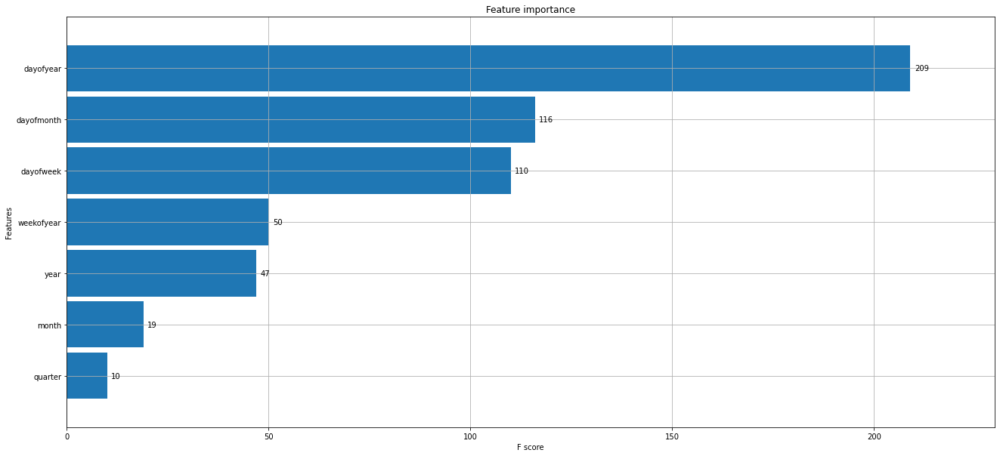

In [ ]:
from xgboost import plot_importance, plot_tree
_ = plot_importance(reg, height=0.9)

In [ ]:
test['Prediction'] = reg.predict(X_test)
df_all = pd.concat([test, train], sort=False)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


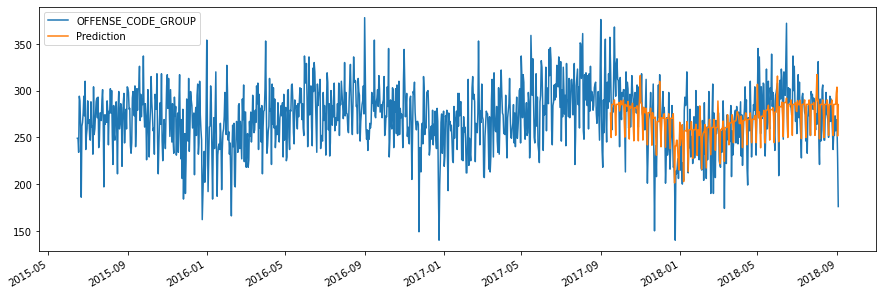

In [ ]:
_ = df_all[['OFFENSE_CODE_GROUP','Prediction']].plot(figsize=(15, 5))


In [ ]:
from sklearn.metrics import mean_squared_error, mean_absolute_error
mean_squared_error(y_true=test['OFFENSE_CODE_GROUP'],
                   y_pred=test['Prediction'])

725.4856044778933

In [ ]:
mean_absolute_error(y_true=test['OFFENSE_CODE_GROUP'],
                   y_pred=test['Prediction'])

20.158121687156957